### Loading the super-tensor and creating the temporal networks

In this notebook we will explore the class __temporal_nets__ to compute preliminar results using network analysis.

In [1]:
# Adding GDa to path
import sys
sys.path.insert(1, '/home/vinicius/GrayData-Analysis')

# GDa
from   GDa.temporal_network              import temporal_network
from   xfrites.conn.conn_coh             import conn_coherence_wav
from   GDa.session                       import session
from   GDa.util                          import smooth
from   frites.utils                      import parallel_func


from   GDa.graphics.plot_raster          import plot_nodes_raster_all_bands 
from   GDa.graphics.plot_coherence_dists import plot_pooled_coherence_dists,\
                                                plot_pooled_coherence_dists_per_stage,\
                                                plot_pooled_coherence_dists_per_stim
from   GDa.graphics.plot_adjacency       import plot_adjacency 
from   GDa.net.layerwise                 import *
from   GDa.net.null_models               import *
from   GDa.net.temporal                  import *


import seaborn                           as       sns
import numpy                             as       np
import xarray                            as       xr
import matplotlib.pyplot                 as       plt
import scipy.signal
import time
import os
import h5py
from   tqdm                              import tqdm
from   joblib                            import Parallel, delayed
from   scipy                             import stats

In [2]:
# Bands names
band_names  = [r'band 1', r'band 2', r'band 3', r'band 4', r'band 5']
stages      = ['baseline', 'cue', 'delay', 'match']

### Loading session

In [3]:
# Parameters to read the data
idx      = 3 
nses     = 1
nmonkey  = 0
align_to = 'cue'

dirs = { 'rawdata':'/home/vinicius/GrayData-Analysis/GrayLab/',
         'results':'Results/',
         'monkey' :['lucy', 'ethyl'],
         'session':'session01',
         'date'   :[['141014', '141015', '141205', '150128', '150211', '150304'], []] }

In [4]:
#  Instantiating session
ses   = session(raw_path = dirs['rawdata'], monkey = dirs['monkey'][nmonkey], date = dirs['date'][nmonkey][idx],
                session = nses, slvr_msmod = False, align_to = align_to, evt_dt = [-0.65, 3.00])
# Load data
ses.read_from_mat()

### Coherence computation

In [5]:
# Defining parameters
f_start, f_end, n_freqs, sfreq = .1, 80, 50, ses.data.attrs['fsample']
freqs = np.linspace(f_start, f_end, n_freqs, endpoint=True)
delta = 15 # Downsampling factor
mode  = 'morlet' # ("morlet", "mt_1", "mt_2")
if mode in ["morlet", "mt_1"]:
    foi   = np.array([
            [0.1, 6.],
            [6., 14.],
            [14., 26.],
            [26., 42.],
            [42., 80.]
                ])
    n_cycles     = freqs/2
    mt_bandwidth = None
    decim_at='tfd'
elif mode is "mt_2":
    foi   = np.array([
            [0.1, 6.],
            [6., 14.],
            [14., 26.],
            [26., 42.],
            [42., 80.]
                ])
    freqs = foi.mean(axis=1)
    W     = np.ceil( foi[:,1]-foi[:,0] )   # Bandwidth
    foi   = None     
    n_cycles     = np.array([3, 5, 9, 12, 16])
    mt_bandwidth = np.array([2, 4, 4.28, 5.647, 9.65])
    decim_at     = 'coh'

In [ ]:
kw = dict(
    freqs=freqs, times=ses.data.time, roi=ses.data.roi, foi=foi, n_jobs=-1,
    sfreq=sfreq, mode=mode, decim_at=decim_at, n_cycles=n_cycles, decim=delta,
    sm_times=300, sm_freqs=1, block_size=2
)

# compute the coherence
coh = conn_coherence_wav(ses.data.values.astype(np.float32), **kw)

In [ ]:
path_st = os.path.join('data', dirs['monkey'][nmonkey], dirs['date'][nmonkey][idx], 'session01', 'super_tensor.h5')

if os.path.isfile(path_st):
    os.system(f'rm {path_st}')

hf = h5py.File(path_st, 'w')

hf.create_dataset('coherence', data=coh.transpose("roi", "trials", "freqs", "times"))
hf.create_dataset('freqs',     data=freqs)
hf.create_dataset('roi',       data=np.array( coh.roi.values, dtype='S' ) )
hf.create_dataset('tarray',    data=coh.times.values)
hf.create_dataset('bands',     data=foi)
[hf.create_dataset('info/'+k,  data=ses.data.attrs[k]) for k in ses.data.attrs.keys()]
hf.close()
attrs['t_cue_on'].shape
del coh

When instantiated, the temporal network object will load the recording info for the monkey, date, and session specified as well as the super tensor; The trial type and the behavioral response can also be specified.

The super-tensor has dimensions [Number of pairs, Number of frequency bands, Number of trials, Time]. For Lucy the frequency bands analysed are:

- band $1$  = [0.1,6]  Hz;
- band $2$  = [6,14]   Hz;
- band $3$  = [14,26]  Hz;
- band $4$  = [26,42]  Hz;
- band $5$  = [42,80]  Hz;

The __temporal_network__ class can also be instantiated by setting threshold as __True__ this will automatically threshold the super-tensor (computed for all trial types independent on how the trial type parameter was set).

In [6]:
# Default threshold
q_thr = 0.8

In [7]:
# Instantiating a temporal network object without thresholding the data
net =  temporal_network(data_raw_path='../GrayLab/', 
                        tensor_raw_path='data/', monkey=dirs['monkey'][nmonkey], 
                        session=1, date='150128', trial_type=[1],
                        behavioral_response=[1], wt=(30,30), drop_trials_after=True,
                        relative=True, q=q_thr, verbose=True)

Computing coherence thresholds


100%|██████████| 5/5 [00:54<00:00, 10.97s/it]


In [8]:
net.convert_to_adjacency()
d_eu = net.super_tensor.attrs['d_eu']
net.create_stage_masks(flatten=True)

### Visualizing the super tensor

#### Binary super-tensor

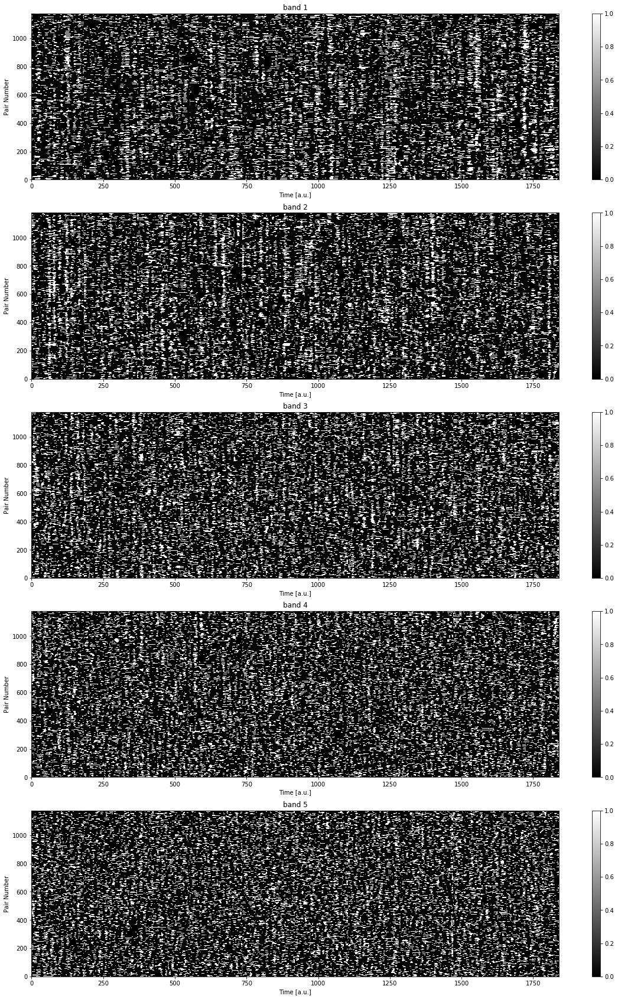

In [9]:
plt.figure(figsize=(20,30))
for i in range(len(band_names)):
    plt.subplot(len(band_names), 1, i+1)
    plt.imshow(net.super_tensor[:,i,:10,:].stack(observations=('trials','time')), 
               aspect = 'auto', cmap = 'gray', origin = 'lower', 
               extent = [0, 10*len(net.tarray), 1, net.session_info['nP']], vmin = 0, vmax = 1)
    plt.colorbar()
    plt.ylabel('Pair Number')
    plt.xlabel('Time [a.u.]')
    plt.title(band_names[i])

#### Plotting average for trials with similar delay durations

In [10]:
win_delay=[
           [1,1.1],
           [1.1, 1.2], 
           [1.2, 1.3], 
           [1.3, 1.4], 
           [1.4, 1.6]
          ]

avg_st = net.get_averaged_st(win_delay=win_delay)

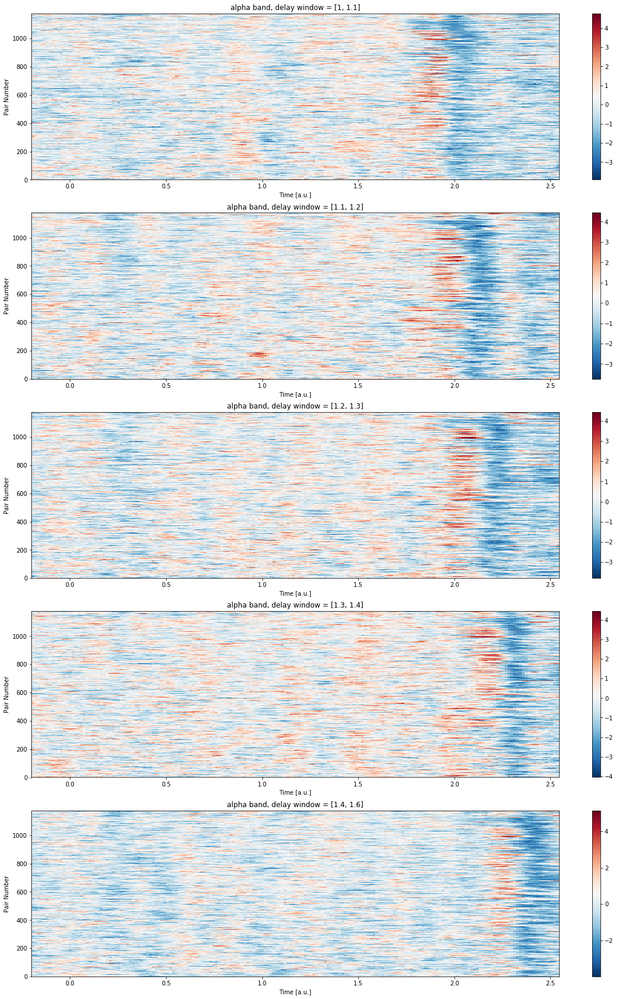

In [11]:
plt.figure(figsize=(20,30))
aux  = scipy.stats.zscore(net.super_tensor.mean(dim='trials'), axis=-1)
band = 1
for i in range(len(avg_st)):
    plt.subplot(len(avg_st), 1, i+1)
    aux = ( avg_st[i][:,band,:]-avg_st[i][:,band,:].mean(dim='time') ) / avg_st[i][:,band,:].std(dim='time')
    plt.imshow(aux, 
               aspect = 'auto', cmap = 'RdBu_r', origin = 'lower',
               extent = [net.tarray[0], net.tarray[-1], 1, net.session_info['nP']], 
               )
    plt.colorbar()
    plt.ylabel('Pair Number')
    plt.xlabel('Time [a.u.]')
    plt.title(f'alpha band, delay window = {win_delay[i]}')
plt.savefig('img/avg_st_delays.png', dpi=300)

### Null models and temporal correlations

#### Creating null models for each band and randomized edges and time frames.

In [26]:
# Shuffling frames
A_s = np.empty_like(net.A)
# Randomizing edges
A_r = np.empty_like(net.A)

In [27]:
for t in tqdm( range(net.super_tensor.sizes['trials']) ):
    for i in range(len(net.bands)):
        A_s[:,:,i,t,:] = shuffle_frames(net.A[:,:,i,t,:].values)

100%|██████████| 540/540 [00:13<00:00, 39.42it/s]


In [28]:
def randomize_edges_per_band(A, n_rewires, n_jobs):
    assert isinstance(A, xr.DataArray)
    assert isinstance(n_rewires, int)
    assert "bands" in A.dims
    
    n_bands = A.sizes['bands']
    
    def _for_band(band):
        return randomize_edges(A.isel(bands=band), n_rewires=n_rewires)
    
    # define the function to compute in parallel
    parallel, p_fun = parallel_func(
        _for_band, n_jobs=n_jobs, verbose=True,
        total=n_bands)
    # compute the single trial coherence
    A_r = parallel(p_fun(band) for band in range(n_bands))
    A_r = xr.concat(A_r, dim="bands")
    A_r = A_r.transpose("roi_1","roi_2","bands","trials","time")
    return A_r

A_r = randomize_edges_per_band(net.A, 10000, 4)

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.


[Parallel(n_jobs=4)]: Done   5 out of   5 | elapsed: 13.8min finished


Let's compare a random adjacency matrix with its randomized version.

Text(0.5, 1.0, 'Randomized, band 1 observation 71')

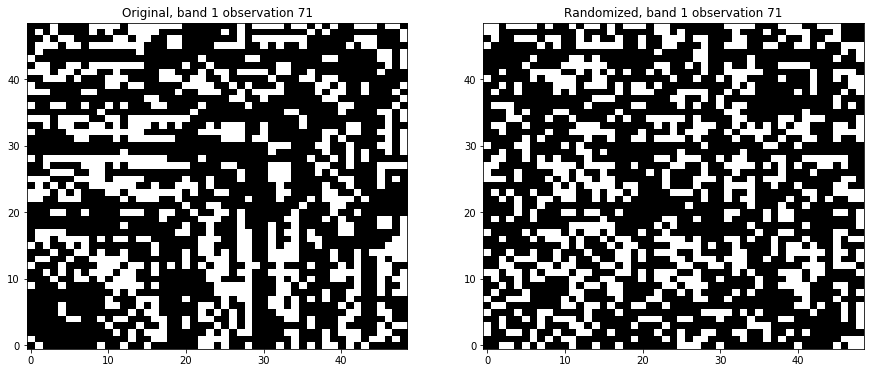

In [13]:
plt.figure(figsize=(15,6))
plt.subplot(1,2,1)
t_rnd = np.random.randint(0, net.super_tensor.shape[-1])
plt.imshow(net.A[:,:,1,10,t_rnd], aspect='auto', cmap='gray', origin='lower')
plt.title(r'Original, band 1 observation ' + str(t_rnd))
plt.subplot(1,2,2)
plt.imshow(A_r[:,:,1,10,t_rnd], aspect='auto', cmap='gray', origin='lower')
plt.title(r'Randomized, band 1 observation ' + str(t_rnd))

/home/vinicius/GrayData-Analysis/GDa/net/temporal.py:21: RuntimeWarning: invalid value encountered in true_divide
  Ci  = np.nansum(( num / den ), axis=1) / (A.shape[-1] - 1)


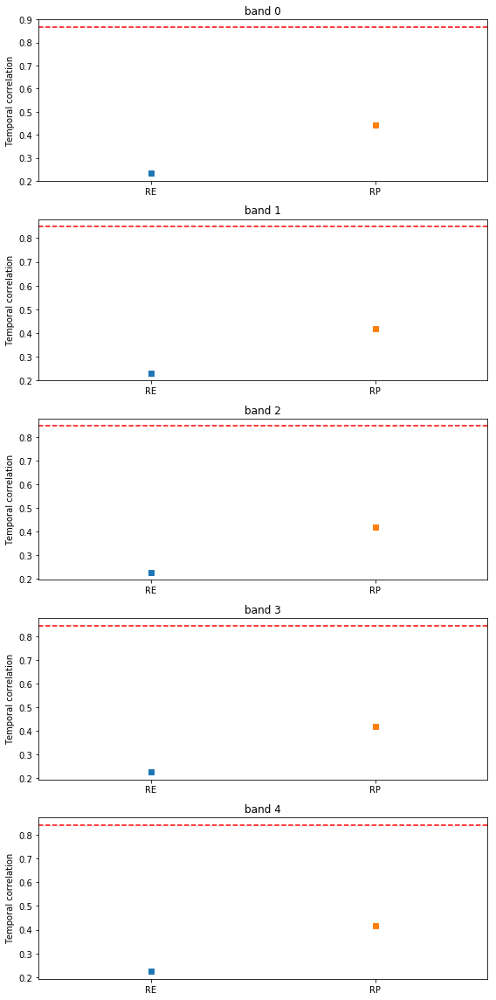

In [16]:
plt.figure(figsize=(8,16))
for i in range(len(net.bands)):
    # Original network
    CC_on = compute_temporal_correlation(
        #net.A[:,:,i,:,:].values.reshape(net.A.shape[0],net.A.shape[1],net.A.shape[3]*net.A.shape[4])
        net.A[:,:,i,:,:].stack(observations=("trials", "time")).values
    )
    # Randomize on edges
    CC_re = compute_temporal_correlation(
        A_r[:,:,i,:,:].stack(observations=("trials","time"))
    )
    # Randomize on time
    CC_rt = compute_temporal_correlation(
        A_s[:,:,i,:,:].reshape(A_s.shape[0],A_s.shape[1],A_s.shape[3]*A_s.shape[4])
    )
    # Plotting
    plt.subplot(5,1,i+1)
    plt.plot(1, CC_re, marker='s')
    plt.plot(3, CC_rt, marker='s')
    plt.hlines(CC_on, 0, 4, linestyle='--', color = 'r')
    plt.xlim([0,4])
    plt.ylabel('Temporal correlation')
    plt.xticks([1,3], ['RE', 'RP'])
    plt.title(f'band {i}')
plt.tight_layout()

### Jaccard index

In [17]:
J = {}
for i in tqdm( range(len(net.bands)) ): 
    J[str(i)] = jaccard_index(net.A[:,:,i,:,:].values, mirror=False)

  0%|          | 0/5 [00:00<?, ?it/s]/home/vinicius/GrayData-Analysis/GDa/net/temporal.py:57: RuntimeWarning: invalid value encountered in true_divide
  J = num/den
100%|██████████| 5/5 [00:14<00:00,  2.82s/it]


100%|██████████| 5/5 [00:00<00:00,  9.24it/s]


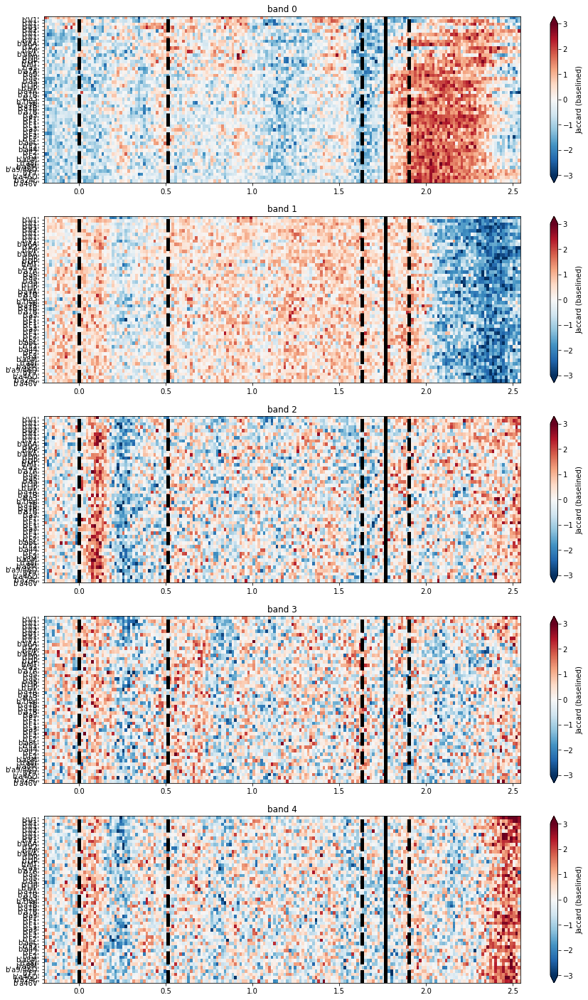

In [18]:
plt.figure(figsize=(15,25))
for i in tqdm( range(len(net.bands)) ):  
    plt.subplot(5,1,i+1)
    aux = np.nansum(J[str(i)], axis=1)/J[str(i)].shape[1]
    aux = (aux-aux.mean(-1)[:,None])/aux.std(-1)[:,None]
    plt.imshow(aux, aspect = 'auto', 
               cmap = 'RdBu_r', origin = 'lower', vmin=-3, vmax=3,
               extent = [net.tarray[0],net.tarray[-1],0,49])
    plt.colorbar(extend='both', label='Jaccard (baselined)')
    plt.vlines(0, 0, 49, linestyle='--', linewidth = 5, color = 'k')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   0, 49, linestyle='--', linewidth = 5, color = 'k')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       0, 49, linestyle='-', linewidth = 5, color = 'k')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       0, 49, linestyle='--', linewidth = 5, color = 'k')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       0, 49, linestyle='--', linewidth = 5, color = 'k')
    plt.yticks(range(49), ses.data.roi.values)
    plt.title(f'band {i}')

100%|██████████| 5/5 [00:03<00:00,  1.64it/s]


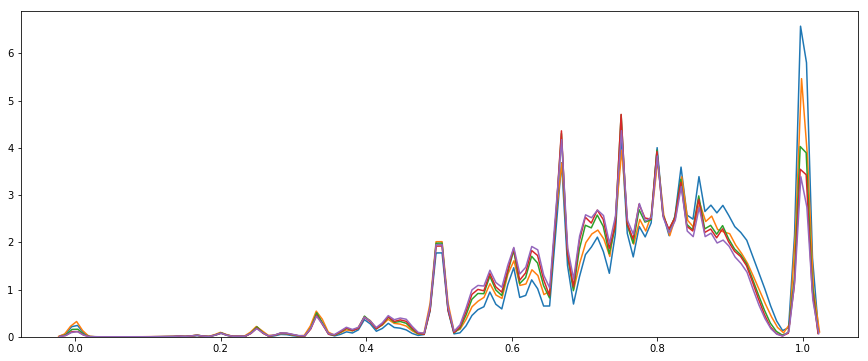

In [19]:
plt.figure(figsize=(15,6))
for i in tqdm( range(len(net.bands)) ):  
    aux = J[str(i)][~np.isnan(J[str(i)])].flatten(order='C')
    sns.kdeplot(data=aux, shade=False)

### Jaccard index - Randomized Edges

In [20]:
J_r = {}
for i in tqdm( range(len(net.bands)) ): 
    J_r[str(i)] = jaccard_index(A_r[:,:,i,:,:].values, mirror=False)

100%|██████████| 5/5 [00:14<00:00,  2.90s/it]


100%|██████████| 5/5 [00:00<00:00,  7.66it/s]


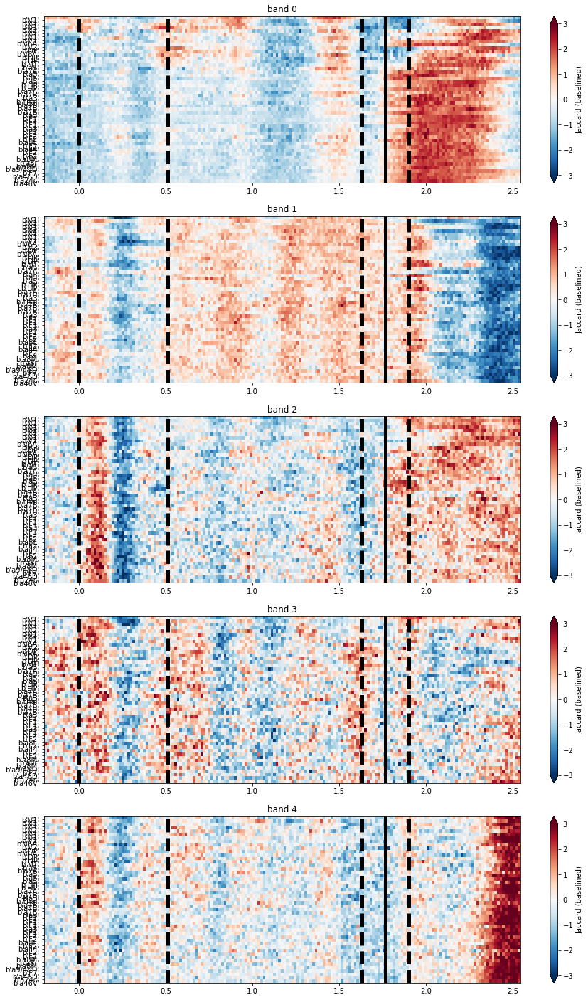

In [21]:
plt.figure(figsize=(15,25))
for i in tqdm( range(len(net.bands)) ):  
    plt.subplot(5,1,i+1)
    aux = np.nansum(J_r[str(i)], axis=1)/J_r[str(i)].shape[1]
    aux = (aux-aux.mean(-1)[:,None])/aux.std(-1)[:,None]
    plt.imshow(aux, aspect = 'auto', 
               cmap = 'RdBu_r', origin = 'lower', vmin=-3, vmax=3,
               extent = [net.tarray[0],net.tarray[-1],0,49])
    plt.colorbar(extend='both', label='Jaccard (baselined)')
    plt.vlines(0, 0, 49, linestyle='--', linewidth = 5, color = 'k')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   0, 49, linestyle='--', linewidth = 5, color = 'k')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       0, 49, linestyle='-', linewidth = 5, color = 'k')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       0, 49, linestyle='--', linewidth = 5, color = 'k')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       0, 49, linestyle='--', linewidth = 5, color = 'k')
    plt.yticks(range(49), ses.data.roi.values)
    plt.title(f'band {i}')

100%|██████████| 5/5 [00:03<00:00,  1.65it/s]


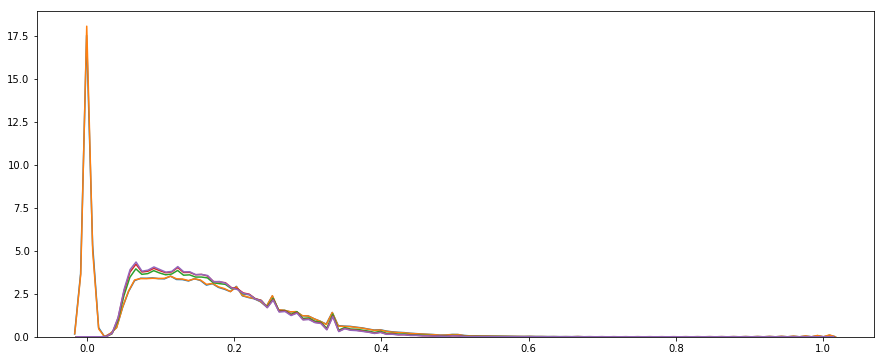

In [22]:
plt.figure(figsize=(15,6))
for i in tqdm( range(len(net.bands)) ):  
    aux = J_r[str(i)][~np.isnan(J_r[str(i)])].flatten(order='C')
    sns.kdeplot(data=aux, shade=False)

### Jaccard index - (Original - Randomized Edges)

100%|██████████| 5/5 [00:00<00:00,  6.89it/s]


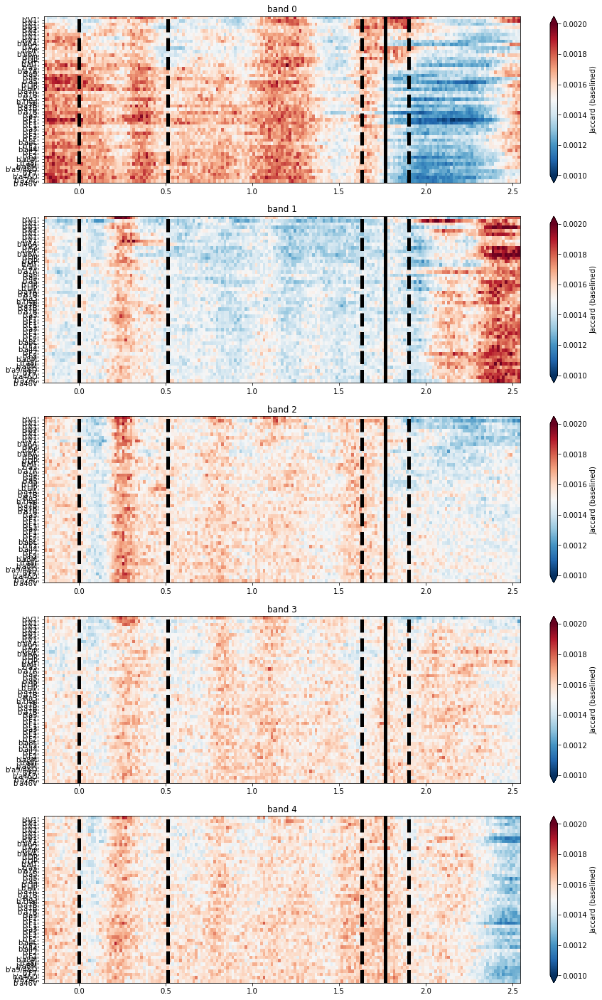

In [23]:
plt.figure(figsize=(15,25))
for i in tqdm( range(len(net.bands)) ):  
    plt.subplot(5,1,i+1)
    aux = 100*(np.nansum(J[str(i)], axis=1)/J[str(i)].shape[1] - np.nansum(J_r[str(i)], axis=1)/J_r[str(i)].shape[1])/np.nansum(J_r[str(i)], axis=1)/J_r[str(i)].shape[1]
    plt.imshow(aux, aspect = 'auto', 
               cmap = 'RdBu_r', origin = 'lower', vmin=0.001,vmax=0.002,
               extent = [net.tarray[0],net.tarray[-1],0,49])
    plt.colorbar(extend='both', label='Jaccard (baselined)')
    plt.vlines(0, 0, 49, linestyle='--', linewidth = 5, color = 'k')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   0, 49, linestyle='--', linewidth = 5, color = 'k')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       0, 49, linestyle='-', linewidth = 5, color = 'k')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       0, 49, linestyle='--', linewidth = 5, color = 'k')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       0, 49, linestyle='--', linewidth = 5, color = 'k')
    plt.yticks(range(49), ses.data.roi.values)
    plt.title(f'band {i}')

### Network measures

We can use the filtered super tensor to compute all sorts of networkd measures. Let's start by analysing the network measurements averaged over trials.

### Node degree

In [50]:
##################################################################################
# NODES' DEGREE
##################################################################################
degree = []
for i in tqdm( range(len(net.bands)) ): 
    degree  += [compute_nodes_degree(net.A[:,:,i,:,:].values, mirror=False)]
degree = xr.concat( degree, dim='bands')

100%|██████████| 5/5 [00:01<00:00,  3.36it/s]


100%|██████████| 5/5 [00:00<00:00,  5.82it/s]


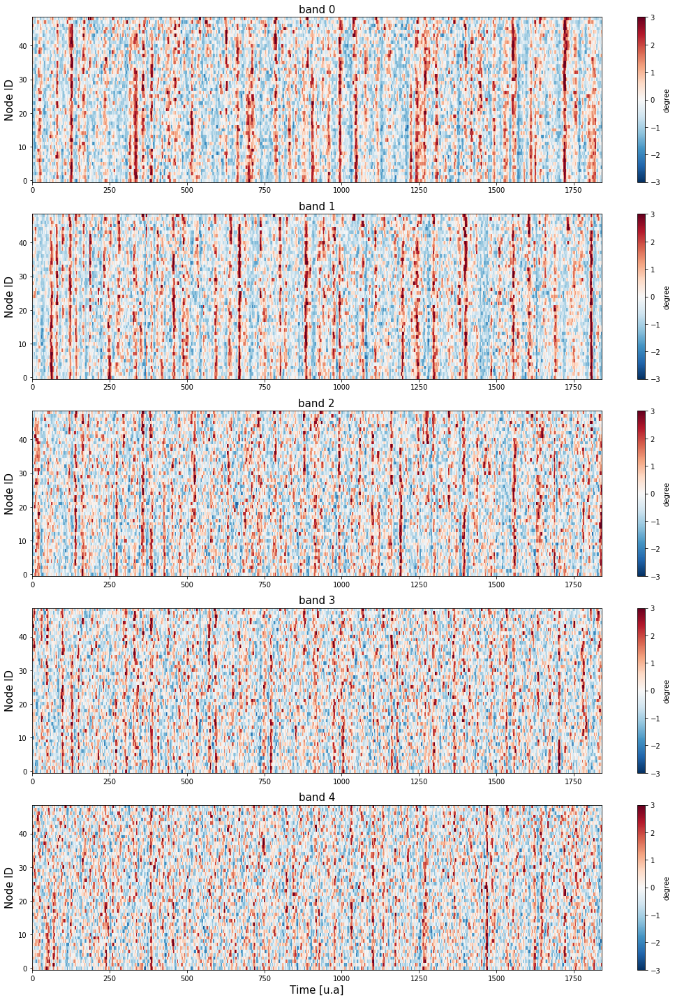

In [51]:
plt.figure(figsize=(15,20))
for i in tqdm( range(len(net.bands)) ):
    plt.subplot(5,1,i+1)
    aux = degree.isel(bands=i)
    aux = (aux-aux.mean(dim="time"))/aux.std(dim="time")
    aux = aux.stack(observations=("trials","time"))
    plt.imshow(aux[...,:10*len(net.tarray)], vmin=-3, vmax=3,
               aspect='auto', cmap='RdBu_r', origin='lower')
    plt.colorbar(label='degree')
    plt.title(f'band {i}', fontsize=15)
    if i == 4: plt.xlabel('Time [u.a]', fontsize=15)
    plt.ylabel('Node ID', fontsize=15)
plt.tight_layout()

It is hard to compare both the weighted and binary version of the measure by means of the raster plot, however we can measure the summed strength/degree of the network for a more general view. Let's plot the the summed degree avareged on trials for each frequency band:

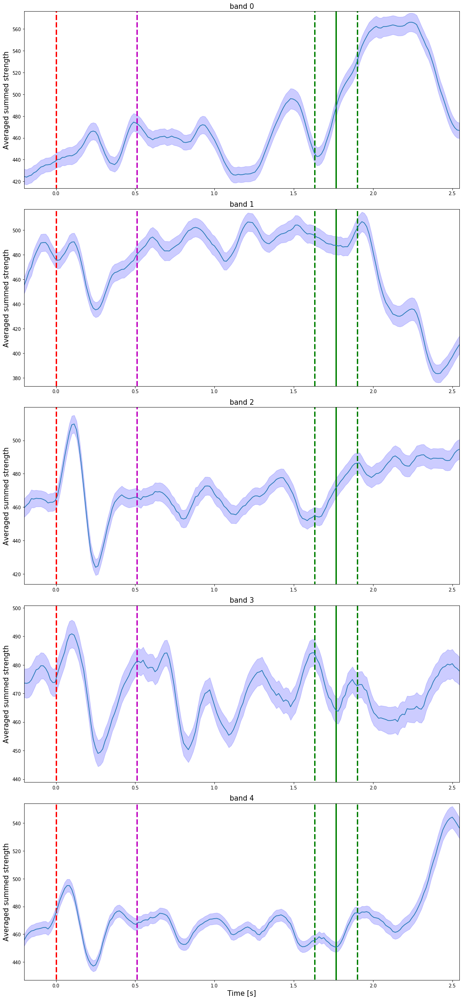

In [52]:
plt.figure(figsize=(14,30))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(len(net.bands),1,j+1)
    # Summed degree for all nodes
    s_d   = degree.isel(bands=j).sum(dim="roi")
    # Average over trials
    s_d_m = s_d.mean(dim="trials") 
    # Std over trials
    s_d_e = s_d.std(dim="trials") / (s_d.sizes["trials"]**0.5)
    plt.plot(net.tarray, s_d_m, label = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color='b')
    #
    plt.title(f'band {j}', fontsize=15)
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-10, s_d_m.max()+10])
    plt.vlines(0, s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed strength', fontsize=15)
    if j==4: plt.xlabel('Time [s]', fontsize=15)
plt.tight_layout()

We can also measure the same quantities for the randomized version of the adjacency matrices:

In [53]:
degree_r = []
for i in tqdm( range(len(net.bands)) ): 
    degree_r  += [compute_nodes_degree(A_r[:,:,i,:,:], mirror=False)]
degree_r = xr.concat( degree_r, dim='bands')

100%|██████████| 5/5 [00:02<00:00,  1.82it/s]


Next we plot the average summed degree for the original and randomized networks

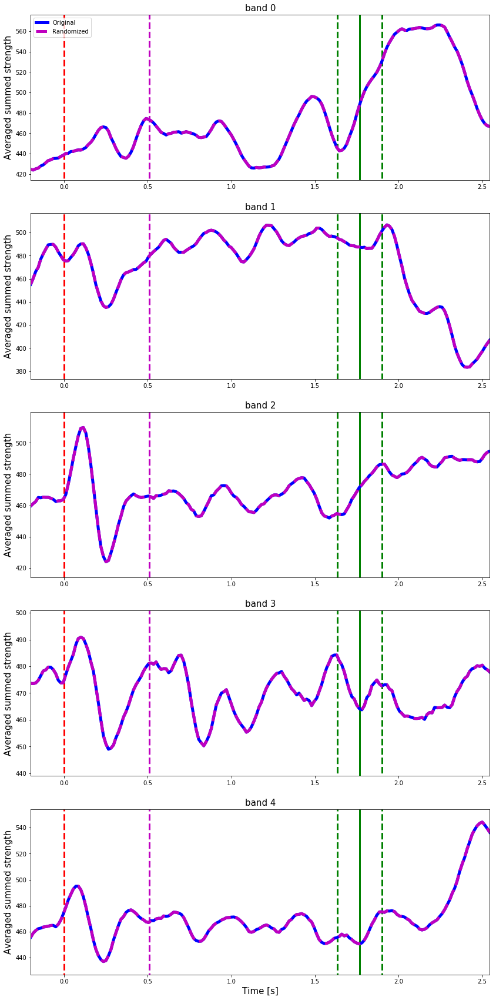

In [54]:
plt.figure(figsize=(14,30))
for j in range( len(net.bands) ):
    plt.subplot(5,1,j+1)
    # Original
    s_d   = degree.isel(bands=j).sum(dim="roi")
    s_d_m = s_d.mean(dim="trials")
    #
    plt.plot(net.tarray, s_d_m, 'b', lw=5)
    # Random
    s_d   = degree_r.isel(bands=j).sum(dim="roi")
    s_d_m = s_d.mean(dim="trials")
    #
    plt.plot(net.tarray, s_d_m, 'm--', lw=5)
    if j == 0:
        plt.legend(['Original', 'Randomized'])
    plt.title(f'band {j}', fontsize=15)
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-10, s_d_m.max()+10])
    plt.vlines(0, s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed strength', fontsize=15)
    if j==4: plt.xlabel('Time [s]', fontsize=15)

### Coreness 

In [55]:
##################################################################################
# NODES' CORENESS
##################################################################################
coreness = []
for i in tqdm( range(len(net.bands)) ): 
    coreness  += [compute_nodes_coreness(net.A[:,:,i,:,:], is_weighted=False, verbose=False)]
coreness = xr.concat( coreness, dim='bands')

100%|██████████| 5/5 [01:22<00:00, 16.48s/it]


100%|██████████| 5/5 [00:00<00:00,  5.81it/s]


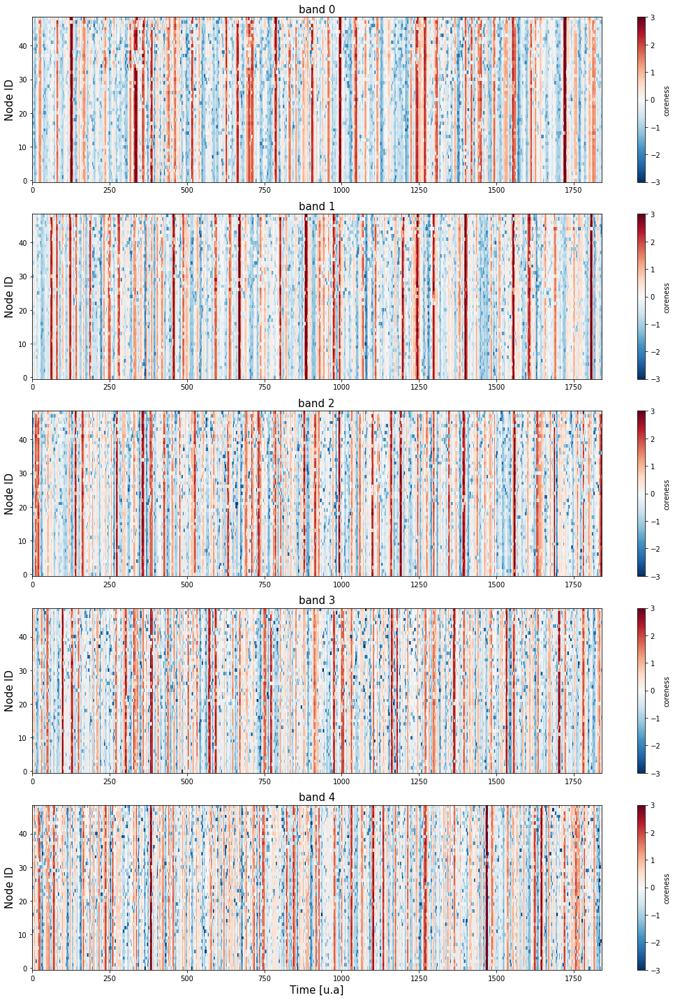

In [56]:
plt.figure(figsize=(15,20))
for i in tqdm( range(len(net.bands)) ):
    plt.subplot(5,1,i+1)
    aux = coreness.isel(bands=i)
    aux = (aux-aux.mean(dim="time"))/aux.std(dim="time")
    aux = aux.stack(observations=("trials","time"))
    plt.imshow(aux[...,:10*len(net.tarray)], vmin=-3, vmax=3,
               aspect='auto', cmap='RdBu_r', origin='lower')
    plt.colorbar(label='coreness')
    plt.title(f'band {i}', fontsize=15)
    if i == 4: plt.xlabel('Time [u.a]', fontsize=15)
    plt.ylabel('Node ID', fontsize=15)
plt.tight_layout()

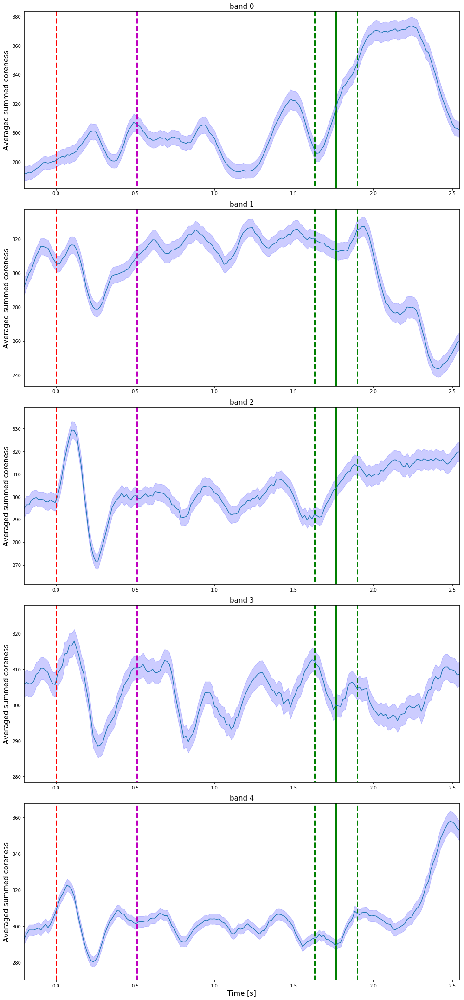

In [57]:
plt.figure(figsize=(14,30))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(len(net.bands),1,j+1)
    # Summed degree for all nodes
    s_d   = coreness.isel(bands=j).sum(dim="roi")
    # Average over trials
    s_d_m = s_d.mean(dim="trials") 
    # Std over trials
    s_d_e = s_d.std(dim="trials") / (s_d.sizes["trials"]**0.5)
    plt.plot(net.tarray, s_d_m, label = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color='b')
    #
    plt.title(f'band {j}', fontsize=15)
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-10, s_d_m.max()+10])
    plt.vlines(0, s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed coreness', fontsize=15)
    if j==4: plt.xlabel('Time [s]', fontsize=15)
plt.tight_layout()

### Coreness - Excess

In [58]:
coreness_r = []
for i in tqdm( range(len(net.bands)) ): 
    coreness_r  += [compute_nodes_coreness(A_r[:,:,i,:,:], is_weighted=False, verbose=False)]
coreness_r = xr.concat( coreness_r, dim='bands')

100%|██████████| 5/5 [01:28<00:00, 17.62s/it]


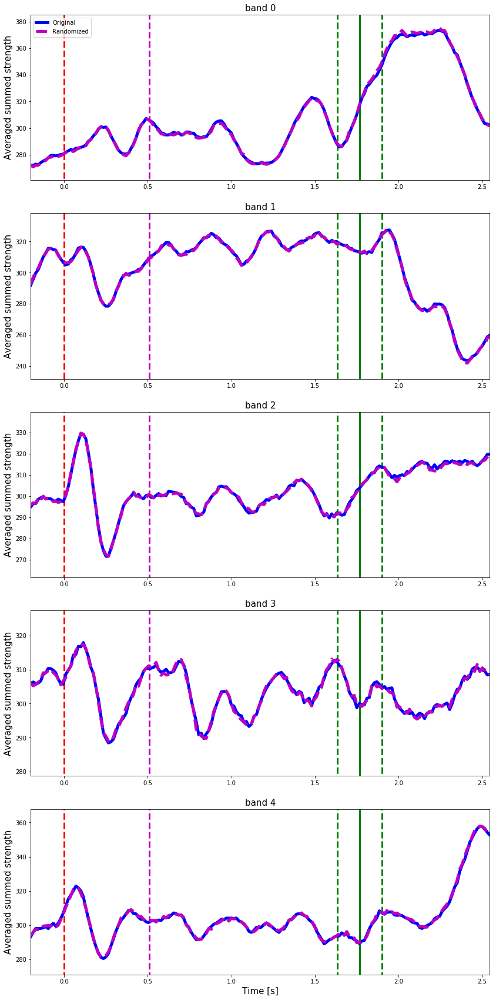

In [59]:
plt.figure(figsize=(14,30))
for j in range( len(net.bands) ):
    plt.subplot(5,1,j+1)
    # Original
    s_d   = coreness.isel(bands=j).sum(dim="roi")
    s_d_m = s_d.mean(dim="trials")
    #
    plt.plot(net.tarray, s_d_m, 'b', lw=5)
    # Random
    s_d   = coreness_r.isel(bands=j).sum(dim="roi")
    s_d_m = s_d.mean(dim="trials")
    #
    plt.plot(net.tarray, s_d_m, 'm--', lw=5)
    if j == 0:
        plt.legend(['Original', 'Randomized'])
    plt.title(f'band {j}', fontsize=15)
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-10, s_d_m.max()+10])
    plt.vlines(0, s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed strength', fontsize=15)
    if j==4: plt.xlabel('Time [s]', fontsize=15)

### Clustering

In [60]:
##################################################################################
# NODES' CLUSTERING
##################################################################################
clustering = []
for i in tqdm( range(len(net.bands)) ): 
    clustering  += [compute_nodes_clustering(net.A[:,:,i,:,:], is_weighted=False, verbose=False)]
clustering = xr.concat( clustering, dim='bands')

100%|██████████| 5/5 [01:30<00:00, 18.18s/it]


100%|██████████| 5/5 [00:00<00:00,  7.03it/s]


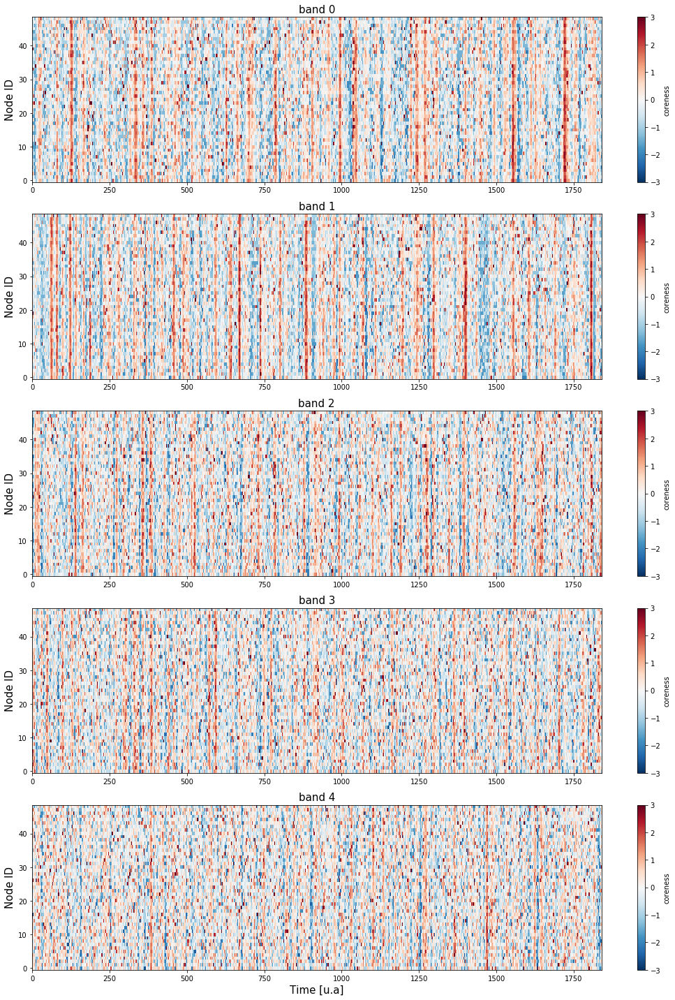

In [61]:
plt.figure(figsize=(15,20))
for i in tqdm( range(len(net.bands)) ):
    plt.subplot(5,1,i+1)
    aux = clustering.isel(bands=i)
    aux = (aux-aux.mean(dim="time"))/aux.std(dim="time")
    aux = aux.stack(observations=("trials","time"))
    plt.imshow(aux[...,:10*len(net.tarray)], vmin=-3, vmax=3,
               aspect='auto', cmap='RdBu_r', origin='lower')
    plt.colorbar(label='coreness')
    plt.title(f'band {i}', fontsize=15)
    if i == 4: plt.xlabel('Time [u.a]', fontsize=15)
    plt.ylabel('Node ID', fontsize=15)
plt.tight_layout()

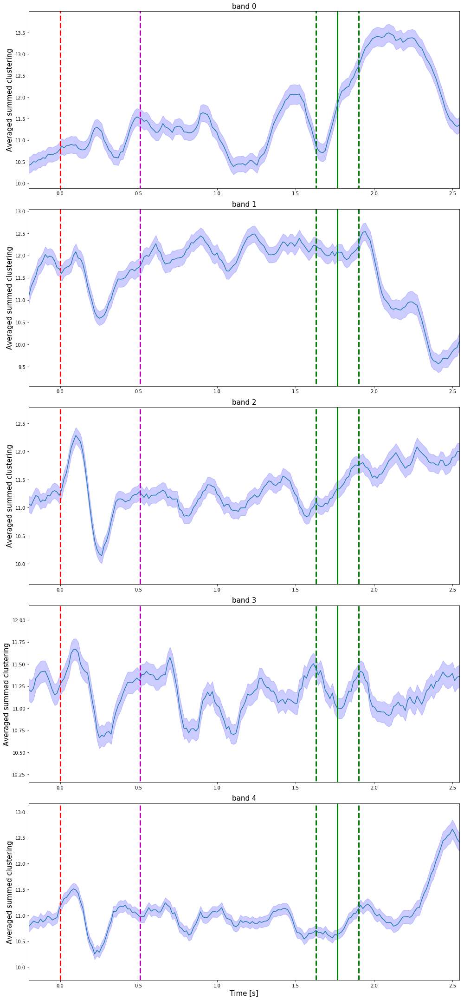

In [62]:
plt.figure(figsize=(14,30))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(len(net.bands),1,j+1)
    # Summed degree for all nodes
    s_d   = clustering.isel(bands=j).sum(dim="roi")
    # Average over trials
    s_d_m = s_d.mean(dim="trials") 
    # Std over trials
    s_d_e = s_d.std(dim="trials") / (s_d.sizes["trials"]**0.5)
    plt.plot(net.tarray, s_d_m, label = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color='b')
    #
    plt.title(f'band {j}', fontsize=15)
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-.5, s_d_m.max()+.5])
    plt.vlines(0, s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed clustering', fontsize=15)
    if j==4: plt.xlabel('Time [s]', fontsize=15)
plt.tight_layout()

### Clustering - Excess

In [63]:
clustering_r = []
for i in tqdm( range(len(net.bands)) ): 
    clustering_r  += [compute_nodes_clustering(A_r.isel(bands=i), is_weighted=False, verbose=False)]
clustering_r = xr.concat( clustering_r, dim='bands')

100%|██████████| 5/5 [01:35<00:00, 19.06s/it]


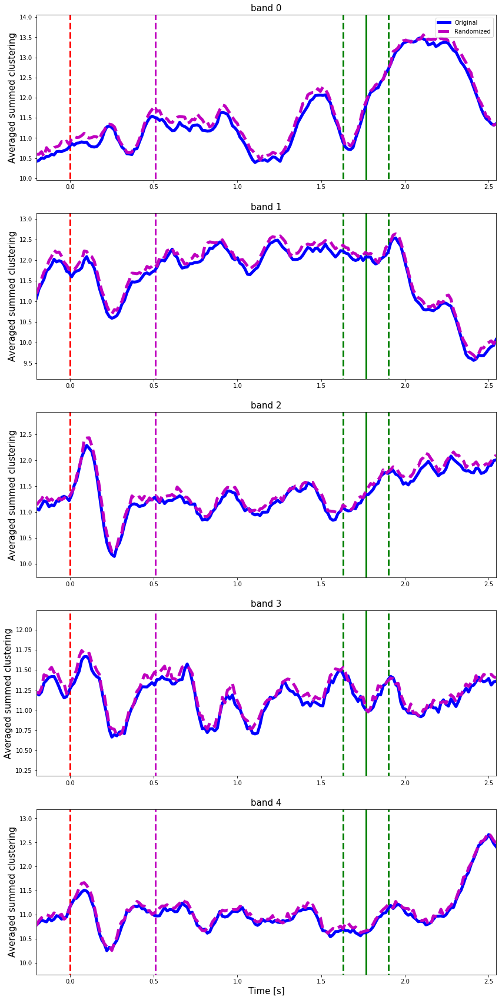

In [64]:
plt.figure(figsize=(14,30))
for j in range( len(net.bands) ):
    plt.subplot(5,1,j+1)
    # Original
    s_d   = clustering.isel(bands=j).sum(dim="roi")
    s_d_m = s_d.mean(dim="trials")
    #
    plt.plot(net.tarray, s_d_m, 'b', lw=5)
    # Random
    s_d   = clustering_r.isel(bands=j).sum(dim="roi")
    s_d_m = s_d.mean(dim="trials")
    #
    plt.plot(net.tarray, s_d_m, 'm--', lw=5)
    if j == 0:
        plt.legend(['Original', 'Randomized'])
    plt.title(f'band {j}', fontsize=15)
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-.5, s_d_m.max()+.5])
    plt.vlines(0, s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed clustering', fontsize=15)
    if j==4: plt.xlabel('Time [s]', fontsize=15)

### Modularity

In [9]:
##################################################################################
# NETWORK MODULARITY
##################################################################################
modularity = []
for i in tqdm( range(len(net.bands)) ): 
    modularity  += [compute_network_modularity(net.A[:,:,i,:,:], is_weighted=False, verbose=False)]
modularity = xr.concat( modularity, dim='bands')

#for i in range(len(net.bands)):
#    Q['modularity'][str(i)] = np.zeros([len(filtered_trials),
#                                        len(net.tarray)])

#for t in range(len(filtered_trials)):
#    for i in range(len(net.bands)):
#        Q['modularity'][str(i)][t,:] = compute_network_modularity(filtered_adjacency[:,:,i,t,:].values, is_weighted=False, verbose=)

100%|██████████| 5/5 [05:52<00:00, 70.52s/it]


100%|██████████| 5/5 [00:00<00:00, 20.91it/s]


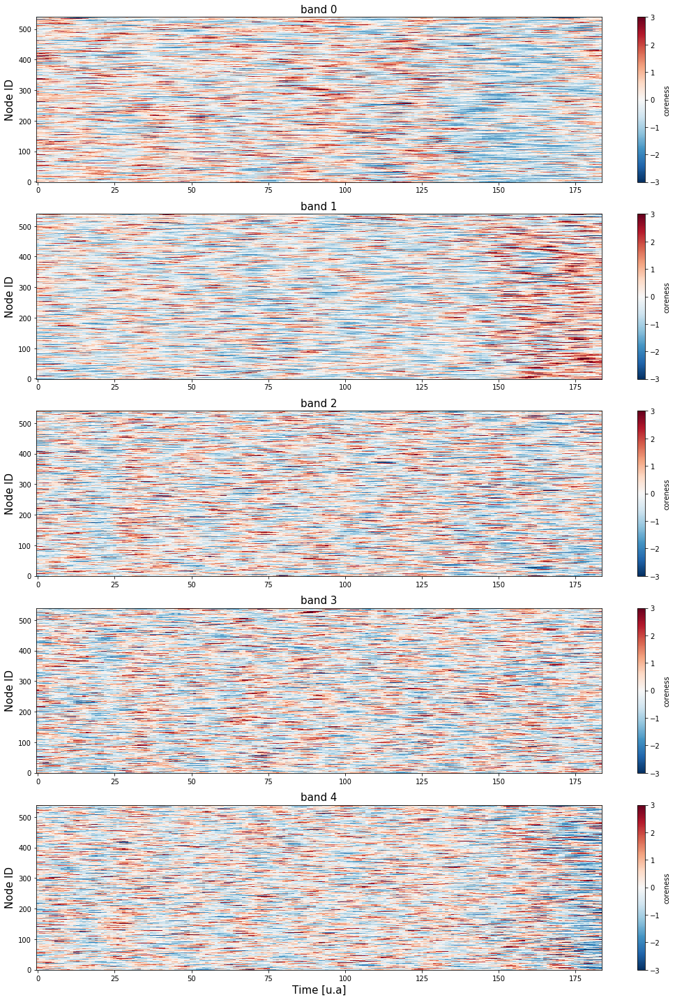

In [19]:
plt.figure(figsize=(15,20))
for i in tqdm( range(len(net.bands)) ):
    plt.subplot(5,1,i+1)
    aux = modularity.isel(bands=i)
    aux = (aux-aux.mean(dim="time"))/aux.std(dim="time")
    plt.imshow(aux, vmin=-3, vmax=3,
               aspect='auto', cmap='RdBu_r', origin='lower')
    plt.colorbar(label='coreness')
    plt.title(f'band {i}', fontsize=15)
    if i == 4: plt.xlabel('Time [u.a]', fontsize=15)
    plt.ylabel('Node ID', fontsize=15)
plt.tight_layout()

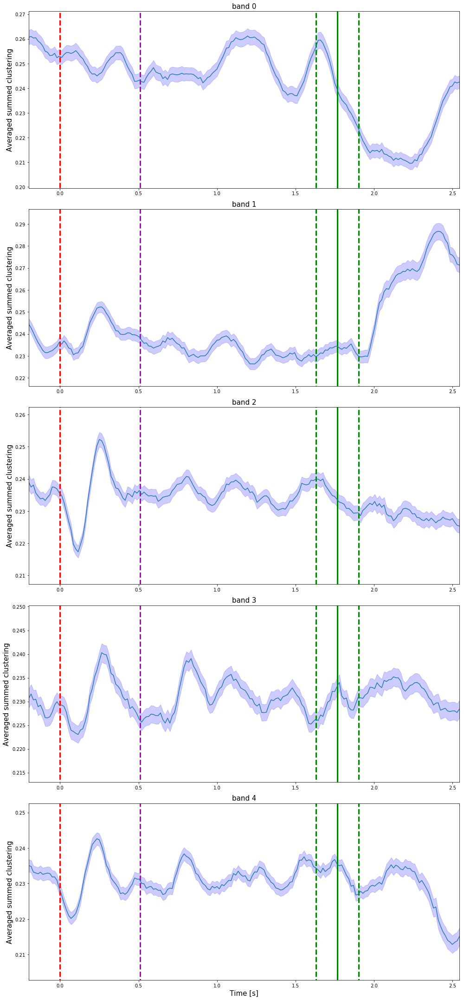

In [25]:
plt.figure(figsize=(14,30))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(len(net.bands),1,j+1)
    # Summed degree for all nodes
    s_d   = modularity.isel(bands=j)
    # Average over trials
    s_d_m = s_d.mean(dim="trials") 
    # Std over trials
    s_d_e = s_d.std(dim="trials") / (s_d.sizes["trials"]**0.5)
    plt.plot(net.tarray, s_d_m, label = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color='b')
    #
    plt.title(f'band {j}', fontsize=15)
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-0.01, s_d_m.max()+0.01])
    plt.vlines(0, s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed clustering', fontsize=15)
    if j==4: plt.xlabel('Time [s]', fontsize=15)
plt.tight_layout()

###  Modularity - Chance level

In [29]:
modularity_r = []
for i in tqdm( range(len(net.bands)) ): 
    modularity_r  += [compute_network_modularity(A_r[:,:,i,:,:], is_weighted=False, verbose=False)]
modularity_r = xr.concat( modularity_r, dim='bands')

100%|██████████| 5/5 [05:49<00:00, 69.83s/it]


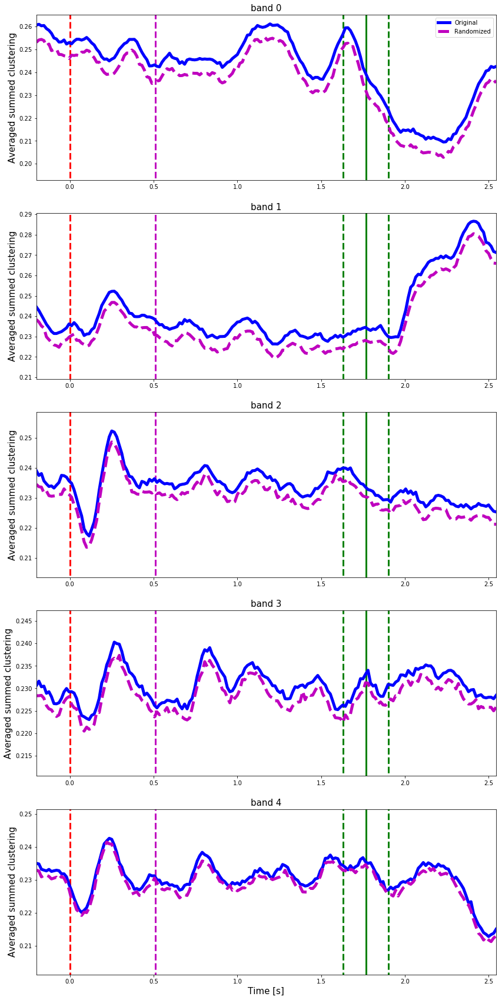

In [31]:
plt.figure(figsize=(14,30))
for j in range( len(net.bands) ):
    plt.subplot(5,1,j+1)
    # Original
    s_d   = modularity.isel(bands=j)
    s_d_m = s_d.mean(dim="trials")
    #
    plt.plot(net.tarray, s_d_m, 'b', lw=5)
    # Random
    s_d   = modularity_r.isel(bands=j)
    s_d_m = s_d.mean(dim="trials")
    #
    plt.plot(net.tarray, s_d_m, 'm--', lw=5)
    if j == 0:
        plt.legend(['Original', 'Randomized'])
    plt.title(f'band {j}', fontsize=15)
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-0.01, s_d_m.max()+0.01])
    plt.vlines(0, s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-100, s_d_m.max()+100, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed clustering', fontsize=15)
    if j==4: plt.xlabel('Time [s]', fontsize=15)

In [34]:
p = compute_network_partition(net.A.isel(bands=0), is_weighted=False, verbose=True)

100%|██████████| 99360/99360 [01:17<00:00, 1280.15it/s]


In [10]:
net.A.isel(bands=0)

<xarray.DataArray (roi_1: 49, roi_2: 49, trials: 540, time: 184)>
array([[[[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.]],

        [[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 1., 1.],
         [1., 1., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 1., 1., 1.]],

        [[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
...
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [1., 1., 1., ..., 1., 1., 1.]],

        [[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [1., 1., 1., ..., 1., 1., 1.]],

        [[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.]]]])
Coordinates:
  * trials   (trials) int64 1 2 3 9 12 13 14 15 ... 875 877 879 880 883 884 886
  * time     (time) float64 -0.2 -0.185 -0.17 -0.155 ... 2.5 2.515 2.53 2.545
  * roi_1    (roi_1) uint8 1 4 9 13 16 17 22 23 ... 210 219 221 224 242 248 250
  * roi_2    (roi_2) uint8 1 4 9 13 16 17 22 23 ... 210 219 221 224 242 248 250

In [48]:
i = 0
j = 0

n_comm = len(p[i]) 
print(f'n_comm = {n_comm}')
print(f'p[{i}]={list(p[i])}')

grid = np.meshgrid(list(p[i][j]), list(p[i][j]))
grid = np.reshape(grid, (2, len(list(p[i][j]))**2)).T

n_comm = 5
p[0]=[[1, 10, 13, 14, 24, 29, 33, 37, 39, 40, 41, 46, 47], [0, 4, 6, 7, 9, 19, 21, 28, 32, 48], [2, 3, 8, 11, 15, 20, 27, 34, 35, 36], [5, 12, 16, 17, 22, 26, 42, 43, 44], [18, 23, 25, 30, 31, 38, 45]]


In [49]:
grid

array([[ 1,  1],
       [10,  1],
       [13,  1],
       [14,  1],
       [24,  1],
       [29,  1],
       [33,  1],
       [37,  1],
       [39,  1],
       [40,  1],
       [41,  1],
       [46,  1],
       [47,  1],
       [ 1, 10],
       [10, 10],
       [13, 10],
       [14, 10],
       [24, 10],
       [29, 10],
       [33, 10],
       [37, 10],
       [39, 10],
       [40, 10],
       [41, 10],
       [46, 10],
       [47, 10],
       [ 1, 13],
       [10, 13],
       [13, 13],
       [14, 13],
       [24, 13],
       [29, 13],
       [33, 13],
       [37, 13],
       [39, 13],
       [40, 13],
       [41, 13],
       [46, 13],
       [47, 13],
       [ 1, 14],
       [10, 14],
       [13, 14],
       [14, 14],
       [24, 14],
       [29, 14],
       [33, 14],
       [37, 14],
       [39, 14],
       [40, 14],
       [41, 14],
       [46, 14],
       [47, 14],
       [ 1, 24],
       [10, 24],
       [13, 24],
       [14, 24],
       [24, 24],
       [29, 24],
       [33, 24

In [36]:
p = compute_network_partition(A, is_weighted=is_weighted, verbose=verbose)

T = np.zeros([nC, nC])

itr = range( len(p) )
for i in (tqdm(itr) if verbose else itr):
    n_comm = len(p[i]) 
    for j in range(n_comm):
        grid = np.meshgrid(list(p[i][j]), list(p[i][j]))
        grid = np.reshape(grid, (2, len(list(p[i][j]))**2)).T
        T[grid[:,0], grid[:,1]] += 1
    T = T / len(p)
    np.fill_diagonal(T, 0)

99360

Defining temporal windows
    Definition of sliding windows (len=0.1, start=-0.19999999999999962, stop=2.545000000000003, step=0.11500000000000002)
    24 windows defined


In [14]:
T

<xarray.DataArray (roi_1: 49, roi_2: 49, time: 53)>
array([[[0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        [0.25079365, 0.26216931, 0.26790123, ..., 0.3058642 ,
         0.30582011, 0.30291005],
        [0.24021164, 0.25793651, 0.26512346, ..., 0.28858025,
         0.29708995, 0.31084656],
        ...,
        [0.21825397, 0.22089947, 0.21697531, ..., 0.20555556,
         0.21111111, 0.21507937],
        [0.21084656, 0.22142857, 0.22654321, ..., 0.19537037,
         0.1957672 , 0.2031746 ],
        [0.20687831, 0.2015873 , 0.20740741, ..., 0.18580247,
         0.1989418 , 0.19708995]],

       [[0.25079365, 0.26216931, 0.26790123, ..., 0.3058642 ,
         0.30582011, 0.30291005],
        [0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        [0.26137566, 0.26904762, 0.27283951, ..., 0.29351852,
         0.30555556, 0.30899471],
...
        [0.21111111, 0.21931217, 0.2287037 , ..., 0.22623457,
         0.23333333, 0.24312169],
        [0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        [0.2026455 , 0.1984127 , 0.20679012, ..., 0.30092593,
         0.31719577, 0.31587302]],

       [[0.20687831, 0.2015873 , 0.20740741, ..., 0.18580247,
         0.1989418 , 0.19708995],
        [0.20343915, 0.2       , 0.20648148, ..., 0.20617284,
         0.19206349, 0.1968254 ],
        [0.2       , 0.21666667, 0.22777778, ..., 0.19382716,
         0.21455026, 0.21455026],
        ...,
        [0.19973545, 0.21269841, 0.19660494, ..., 0.28148148,
         0.2957672 , 0.30978836],
        [0.2026455 , 0.1984127 , 0.20679012, ..., 0.30092593,
         0.31719577, 0.31587302],
        [0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ]]])
Coordinates:
  * roi_1    (roi_1) uint8 1 4 9 13 16 17 22 23 ... 210 219 221 224 242 248 250
  * roi_2    (roi_2) uint8 1 4 9 13 16 17 22 23 ... 210 219 221 224 242 248 250
Dimensions without coordinates: time

In [22]:
win_args=dict(slwin_len=.1, slwin_step=0.05)

for j in range( net.A.sizes['bands'] ):
    T = windowed_allegiance_matrix(net.A.isel(bands=j),
                                   times=net.A.time.values,
                                   is_weighted=False, 
                                   verbose=False, 
                                   win_args=win_args, n_jobs=-1)

    for i in range(T.sizes['time']):
        plt.figure()
        plt.imshow(T.isel(time=i),aspect='auto',cmap='viridis',origin='lower', vmin=0,vmax=0.3)
        plt.title("band "+str(j)+", t = {:.2f}".format(T.time.values[i]))
        plt.colorbar(extend='max',label='Allegiance')
        plt.savefig(f'img/allegiance_band_{j}_t_{i}.png',dpi=120)
        plt.close()

Defining temporal windows
    Definition of sliding windows (len=0.1, start=-0.19999999999999962, stop=2.545000000000003, step=0.05)
    53 windows defined


Defining temporal windows
    Definition of sliding windows (len=0.1, start=-0.19999999999999962, stop=2.545000000000003, step=0.05)
    53 windows defined


Defining temporal windows
    Definition of sliding windows (len=0.1, start=-0.19999999999999962, stop=2.545000000000003, step=0.05)
    53 windows defined


Defining temporal windows
    Definition of sliding windows (len=0.1, start=-0.19999999999999962, stop=2.545000000000003, step=0.05)
    53 windows defined


Defining temporal windows
    Definition of sliding windows (len=0.1, start=-0.19999999999999962, stop=2.545000000000003, step=0.05)
    53 windows defined


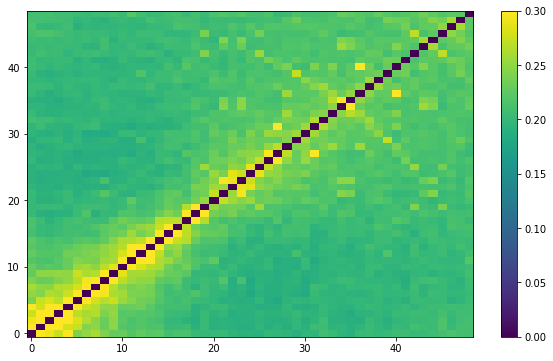

In [12]:
plt.figure(figsize=(10,6))
plt.imshow(T,aspect='auto',cmap='viridis',origin='lower', vmin=0, vmax=.3)
plt.colorbar()

### Allegiance  matrix

In order to compute the allegiance matrix we first have to compute the layerwise community labes of each node in order to verity how often they fall in the same module, the allegiance matrix can be computed by using the method __compute_allegiance_matrix__.

In [66]:
nC = net.super_tensor.attrs['nC']
nT = len(filtered_trials)
T  = np.zeros([nC,nC,len(net.bands),len(s_names)])

In [67]:
# Creating stages mask
s_mask = create_stages_time_grid(net.super_tensor.attrs['t_cue_on'][filtered_trials_idx], 
                                 net.super_tensor.attrs['t_cue_off'][filtered_trials_idx],
                                 net.super_tensor.attrs['t_match_on'][filtered_trials_idx], 
                                 net.super_tensor.attrs['fsample'],
                                 net.tarray, nT, flatten=True)
print(s_mask['baseline'].shape)

(104760,)


In [68]:
filtered_adjacency_stacked = filtered_adjacency.stack(observations=("trials","time"))
for i in tqdm( range(len(net.bands)) ):
    for s_idx, s in zip(range(len(s_names)), s_names):
        T[:,:,i,s_idx] = compute_allegiance_matrix(
                           filtered_adjacency_stacked[:,:,i,s_mask[s]].values,
                           is_weighted=False) 


100%|██████████| 5/5 [12:42<00:00, 152.60s/it]


#### Band 1

/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


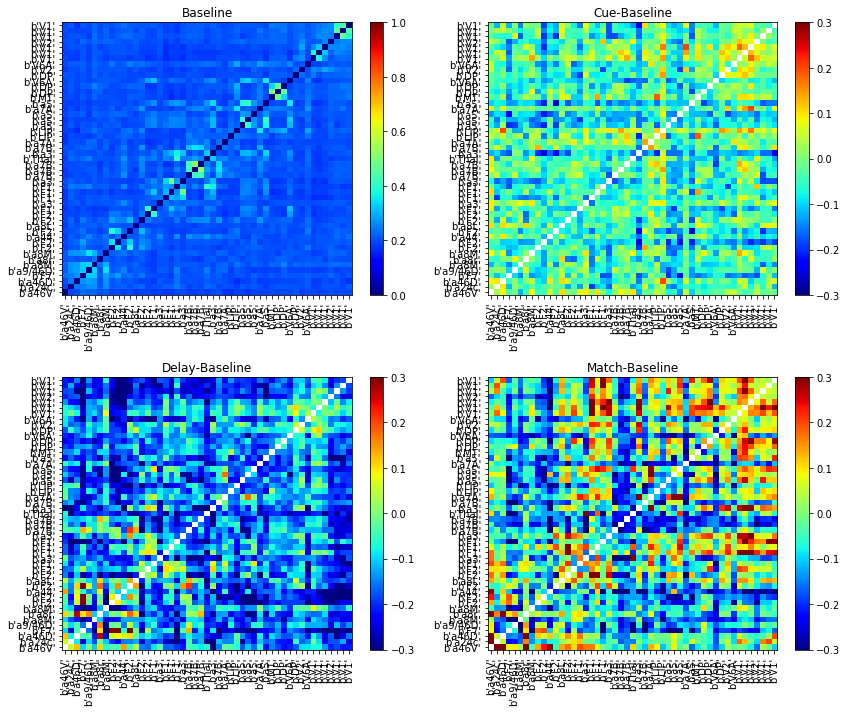

In [69]:
title = ['Baseline', 'Cue-Baseline', 'Delay-Baseline', 'Match-Baseline']
plt.figure(figsize=(12,10))
for k in range(4):
    plt.subplot(2,2,k+1)
    if k > 0:
        plt.imshow((T[:,:,0,k]-T[:,:,0,0])/T[:,:,0,0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = -.3, vmax = .3)
    else:
        plt.imshow(T[:,:,0,0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = 0, vmax = 1)
    plt.colorbar()
    plt.xticks(range(net.session_info['nC']), net.session_info['areas'], rotation = 90)
    plt.yticks(range(net.session_info['nC']), net.session_info['areas'])
    plt.title(title[k])
plt.tight_layout()
plt.savefig('../figures/layerwise_net/allegiance_theta.png')

#### Band 2

/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


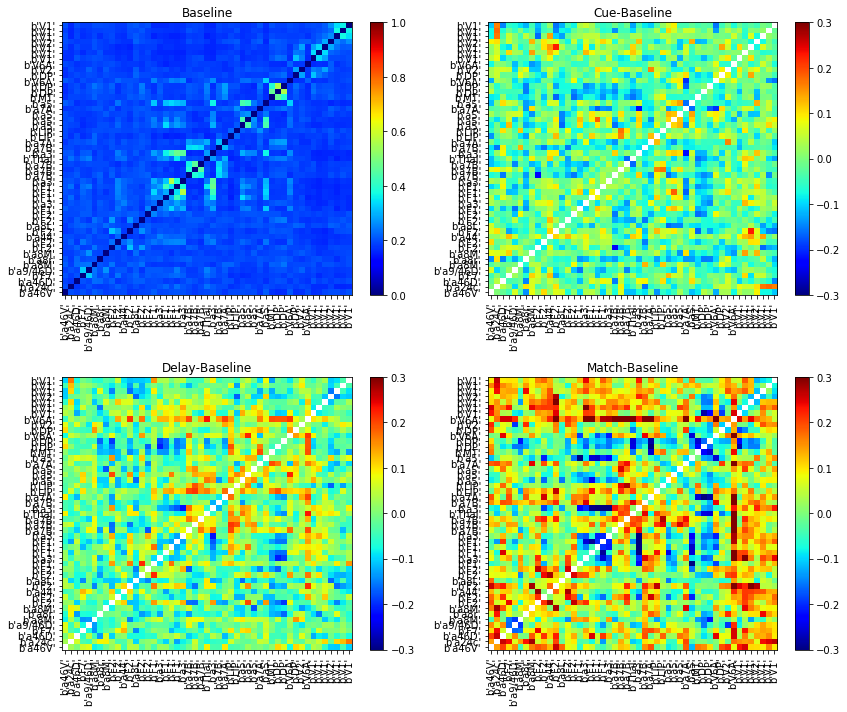

In [70]:
title = ['Baseline', 'Cue-Baseline', 'Delay-Baseline', 'Match-Baseline']
plt.figure(figsize=(12,10))
for k in range(4):
    plt.subplot(2,2,k+1)
    if k > 0:
        plt.imshow((T[:,:,1,k]-T[:,:,1,0])/T[:,:,1,0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = -.3, vmax = .3)
    else:
        plt.imshow(T[:,:,1,0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = 0, vmax = 1)
    plt.colorbar()
    plt.xticks(range(net.session_info['nC']), net.session_info['areas'], rotation = 90)
    plt.yticks(range(net.session_info['nC']), net.session_info['areas'])
    plt.title(title[k])
plt.tight_layout()
plt.savefig('../figures/layerwise_net/allegiance_alpha.png')

#### Band 3

/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


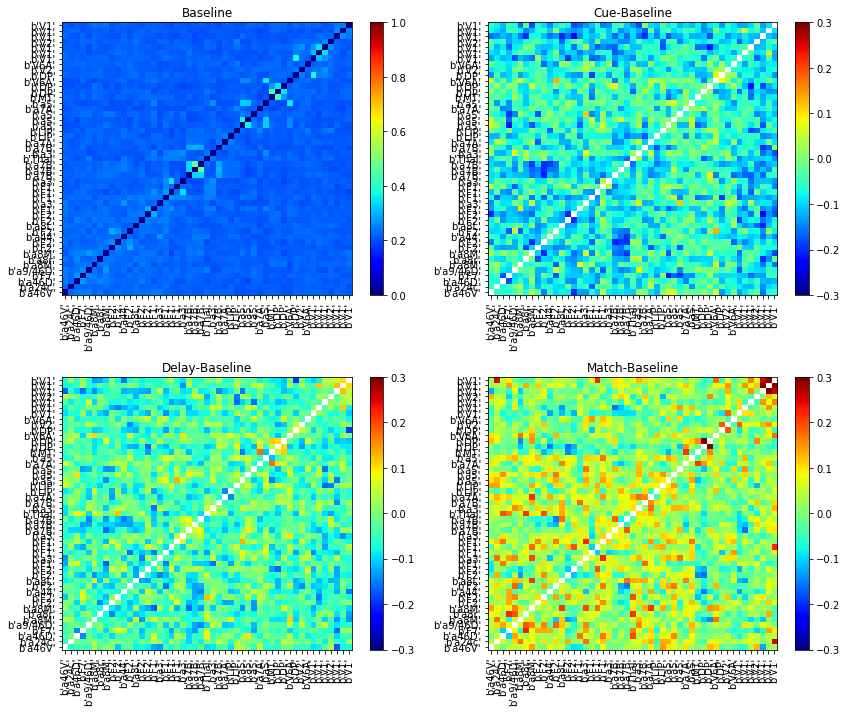

In [71]:
title = ['Baseline', 'Cue-Baseline', 'Delay-Baseline', 'Match-Baseline']
plt.figure(figsize=(12,10))
for k in range(4):
    plt.subplot(2,2,k+1)
    if k > 0:
        plt.imshow((T[:,:,2,k]-T[:,:,2,0])/T[:,:,2,0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = -.3, vmax = .3)
    else:
        plt.imshow(T[:,:,2,0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = 0, vmax = 1)
    plt.colorbar()
    plt.xticks(range(net.session_info['nC']), net.session_info['areas'], rotation = 90)
    plt.yticks(range(net.session_info['nC']), net.session_info['areas'])
    plt.title(title[k])
plt.tight_layout()
plt.savefig('../figures/layerwise_net/allegiance_beta.png')

#### Band 4

/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


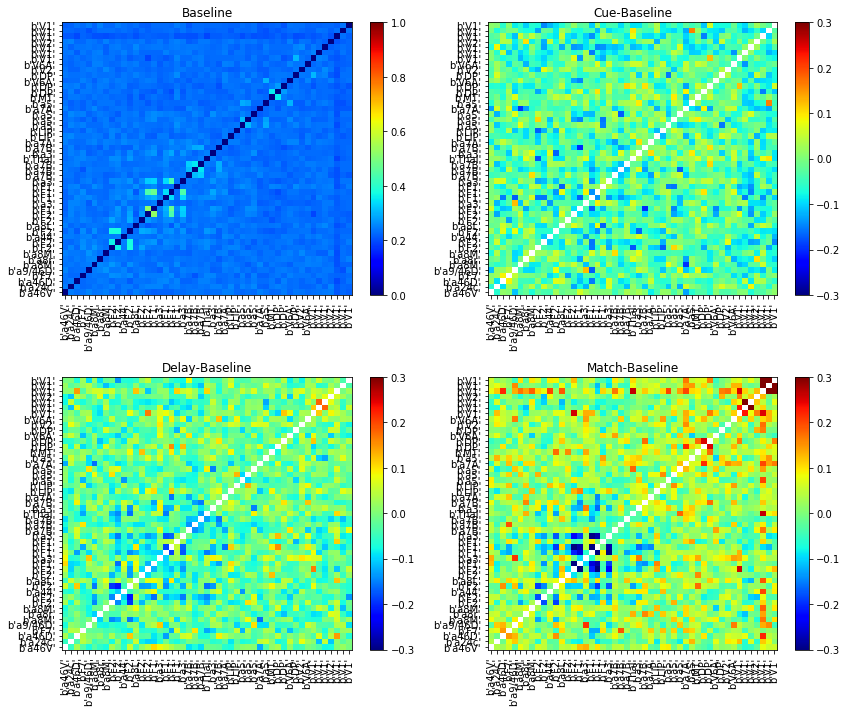

In [72]:
title = ['Baseline', 'Cue-Baseline', 'Delay-Baseline', 'Match-Baseline']
plt.figure(figsize=(12,10))
for k in range(4):
    plt.subplot(2,2,k+1)
    if k > 0:
        plt.imshow((T[:,:,3,k]-T[:,:,3,0])/T[:,:,3,0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = -.3, vmax = .3)
    else:
        plt.imshow(T[:,:,3,0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = 0, vmax = 1)
    plt.colorbar()
    plt.xticks(range(net.session_info['nC']), net.session_info['areas'], rotation = 90)
    plt.yticks(range(net.session_info['nC']), net.session_info['areas'])
    plt.title(title[k])
plt.tight_layout()
plt.savefig('../figures/layerwise_net/allegiance_gamma.png')

#### Band 5

/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


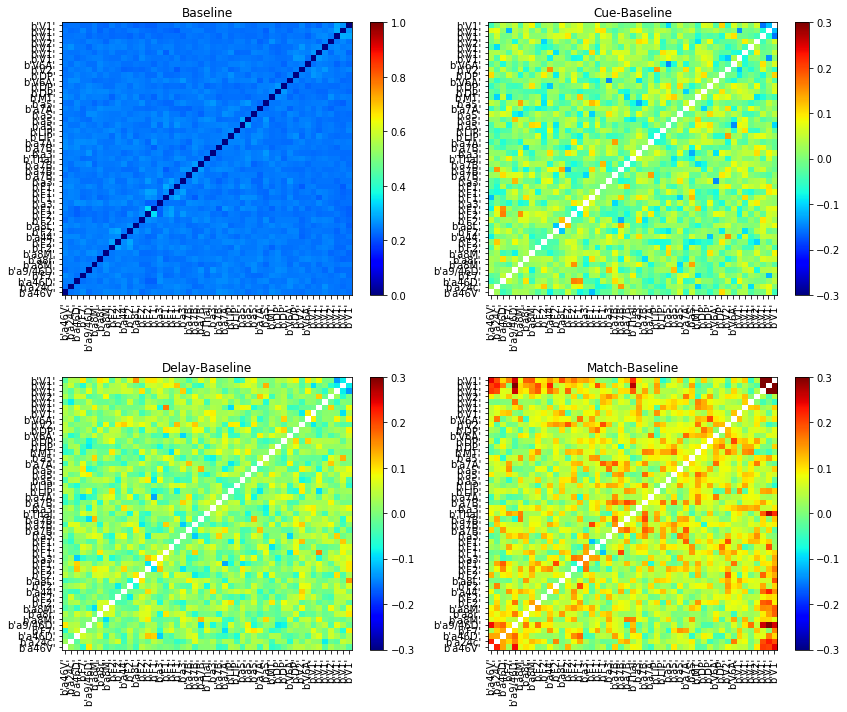

In [73]:
title = ['Baseline', 'Cue-Baseline', 'Delay-Baseline', 'Match-Baseline']
plt.figure(figsize=(12,10))
for k in range(4):
    plt.subplot(2,2,k+1)
    if k > 0:
        plt.imshow((T[:,:,4,k]-T[:,:,4,0])/T[:,:,4,0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = -.3, vmax = .3)
    else:
        plt.imshow(T[:,:,4,0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = 0, vmax = 1)
    plt.colorbar()
    plt.xticks(range(net.session_info['nC']), net.session_info['areas'], rotation = 90)
    plt.yticks(range(net.session_info['nC']), net.session_info['areas'])
    plt.title(title[k])
plt.tight_layout()
plt.savefig('../figures/layerwise_net/allegiance_high_gamma.png')

### Plotting on the brain surface

Plotting some of the quantities we measured above in the brain surface.

In [58]:
# Creating stages mask with trials concatenated
s_mask = create_stages_time_grid(net.super_tensor.attrs['t_cue_on'][filtered_trials_idx],
                                 net.super_tensor.attrs['t_cue_off'][filtered_trials_idx],
                                 net.super_tensor.attrs['t_match_on'][filtered_trials_idx], 
                                 net.super_tensor.attrs['fsample'],
                                 net.tarray, len(filtered_trials_idx), flatten=True)

In [59]:
from GDa.graphics.plot_brain_sketch import plot_node_brain_sketch, plot_edge_brain_sketch

In [60]:
Q['degree'][str(i)].reshape(net.super_tensor.attrs['nC'],len(filtered_trials) * len(net.tarray)).shape

(49, 104760)

#### Plotting average strength 

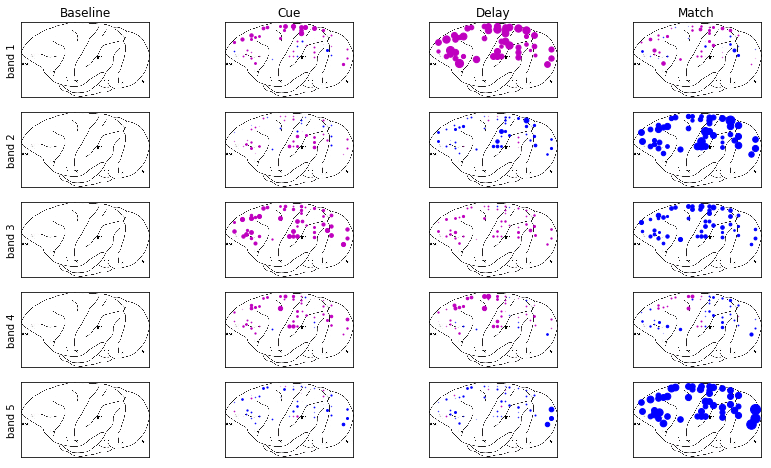

In [61]:
count = 1
alpha = 20
beta  = 1
plt.figure(figsize=(14,8))
for i in range( len(net.bands) ):
    plt.subplot(5, 4, count)
    aux    = Q['degree'][str(i)].reshape(net.super_tensor.attrs['nC'],len(filtered_trials) * len(net.tarray))
    # Baseline
    st_b   = aux[:,s_mask['baseline']].mean(axis=-1)
    sst_b  = aux[:,s_mask['baseline']].std(axis=-1)
    #st_bn = st_random[:,i,net.t_baseline].mean(axis=1)
    #st_b  = (st_b - st_b)/st_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_b-st_b, alpha, beta, 'hot')
    count += 1
    plt.ylabel(bands[i])
    if i == 0: plt.title('Baseline')
    # Cue
    plt.subplot(5, 4, count)
    st_c = aux[:,s_mask['cue']].mean(axis=-1)
    #st_cn = st_random[:,i,net.t_cue].mean(axis=1)
    st_c = (st_c - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_c, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Cue')
    # Delay
    plt.subplot(5, 4, count)
    st_d = aux[:,s_mask['delay']].mean(axis=-1).mean(axis=-1)
    #st_dn = st_random[:,i,net.t_delay].mean(axis=1)
    st_d = (st_d - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_d, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Delay')
    # Match
    plt.subplot(5, 4, count)
    st_m = aux[:,s_mask['match']].mean(axis=-1).mean(axis=-1)
    #st_mn = st_random[:,i,net.t_match].mean(axis=1)
    st_m = (st_m - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_m, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Match')
plt.savefig('../figures/layerwise_net/st_brain_map.png')

#### Plotting average coreness 

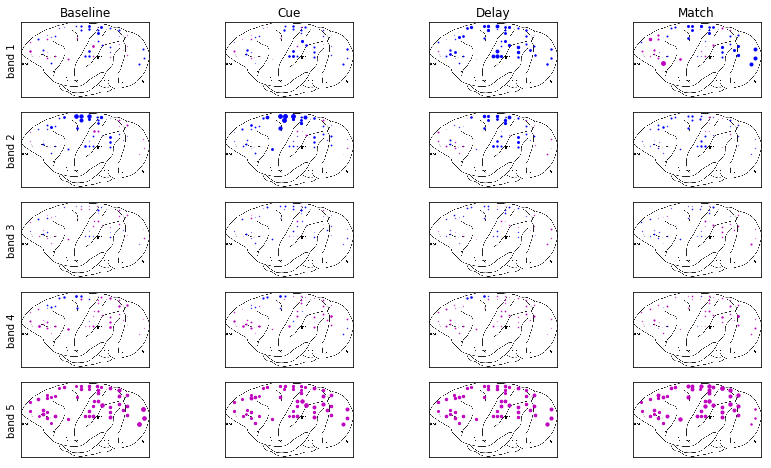

In [62]:
count = 1
alpha = 100
beta  = 1
plt.figure(figsize=(14,8))
for i in range( len(net.bands) ):
    plt.subplot(5, 4, count)
    aux    = Q['coreness'][str(i)].reshape(net.super_tensor.attrs['nC'],len(filtered_trials) * len(net.tarray))
    aux_r  = Qr['coreness'][str(i)].reshape(net.super_tensor.attrs['nC'],len(filtered_trials) * len(net.tarray))
    # Baseline
    st_b   = aux[:,s_mask['baseline']].mean(axis=1)
    sst_b  = aux_r[:,s_mask['baseline']].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_b-sst_b)/sst_b, alpha, beta, 'hot')
    count += 1
    plt.ylabel(bands[i])
    if i == 0: plt.title('Baseline')
    # Cue
    plt.subplot(5, 4, count)
    st_c  = aux[:,s_mask['cue']].mean(axis=1)
    sst_c = aux_r[:,s_mask['cue']].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_c-sst_c)/sst_c, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Cue')
    # Delay
    plt.subplot(5, 4, count)
    st_d  = aux[:,s_mask['delay']].mean(axis=1)
    sst_d = aux_r[:,s_mask['delay']].mean(axis=1)
    #st_dn = st_random[:,i,net.t_delay].mean(axis=1)
    #st_d = (st_d - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_d-sst_d)/sst_d, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Delay')
    # Match
    plt.subplot(5, 4, count)
    st_m  = aux[:,s_mask['match']].mean(axis=1)
    sst_m = aux_r[:,s_mask['match']].mean(axis=1)
    #st_mn = st_random[:,i,net.t_match].mean(axis=1)
    #st_m = (st_m - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_m-sst_m)/sst_m, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Match')
plt.savefig('../figures/layerwise_net/coreness_brain_map.png')

#### Plotting average coreness (95% percentile)

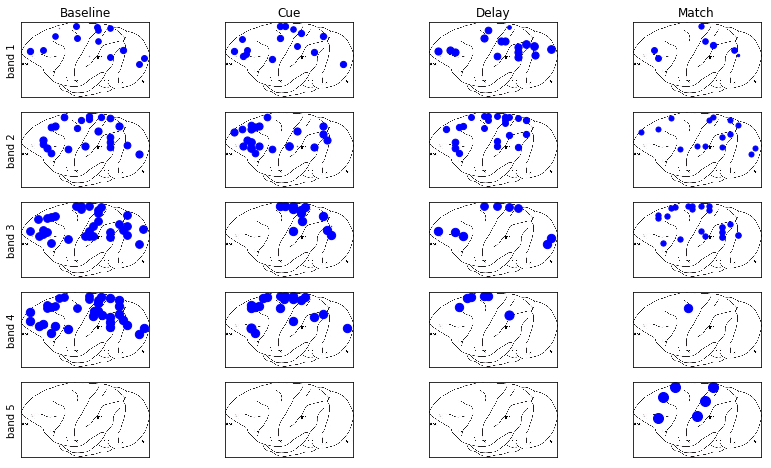

In [63]:
count = 1
alpha = 100
beta  = 1
plt.figure(figsize=(14,8))
for i in range( len(net.bands) ):
    plt.subplot(5, 4, count)
    aux    = Q['coreness'][str(i)].reshape(net.super_tensor.attrs['nC'],len(filtered_trials) * len(net.tarray))
    aux_r  = Qr['coreness'][str(i)].reshape(net.super_tensor.attrs['nC'],len(filtered_trials) * len(net.tarray))
    # Baseline
    st_b   = np.percentile(aux[:,s_mask['baseline']], 95, axis=1)
    sst_b  = np.percentile(aux_r[:,s_mask['baseline']], 95, axis=1)
    #st_bn = st_random[:,i,net.t_baseline].mean(axis=1)
    #st_b  = (st_b - st_b)/st_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_b-sst_b)/sst_b, alpha, beta, 'hot')
    count += 1
    plt.ylabel(bands[i])
    if i == 0: plt.title('Baseline')
    # Cue
    plt.subplot(5, 4, count)
    st_c  = np.percentile(aux[:,s_mask['cue']], 95, axis=1)
    sst_c = np.percentile(aux_r[:,s_mask['cue']], 95, axis=1)
    #st_cn = st_random[:,i,net.t_cue].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_c-sst_c)/sst_c, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Cue')
    # Delay
    plt.subplot(5, 4, count)
    st_d  = np.percentile(aux[:,s_mask['delay']], 95, axis=1)
    sst_d = np.percentile(aux_r[:,s_mask['delay']], 95, axis=1)
    #st_dn = st_random[:,i,net.t_delay].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_d-sst_d)/sst_d, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Delay')
    # Match
    plt.subplot(5, 4, count)
    st_m  = np.percentile(aux[:,s_mask['match']], 95, axis=1)
    sst_m = np.percentile(aux_r[:,s_mask['match']], 95, axis=1)
    #st_mn = st_random[:,i,net.t_match].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_m-sst_m)/sst_m, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Match')
plt.savefig('../figures/layerwise_net/coreness_brain_map95.png')

#### Plotting average clustering

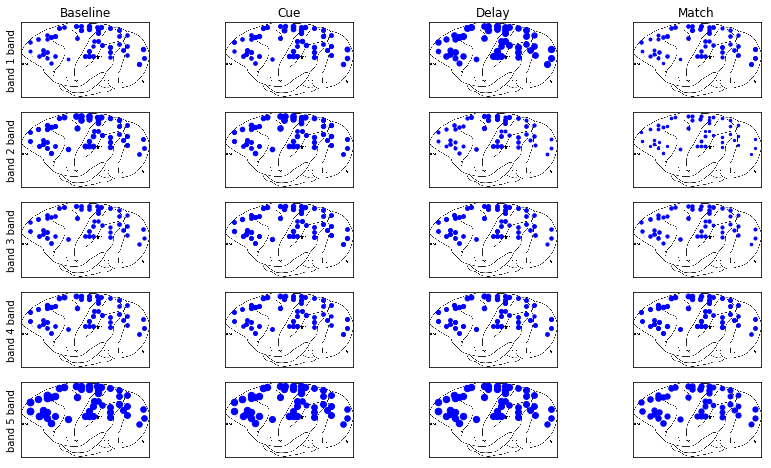

In [64]:
count = 1
alpha = 10
beta  = 1
plt.figure(figsize=(14,8))
for i in range( len(net.bands) ):
    plt.subplot(5, 4, count)
    aux    = Q['clustering'][str(i)].reshape(net.super_tensor.attrs['nC'],len(filtered_trials) * len(net.tarray))
    aux_r  = Qr['clustering'][str(i)].reshape(net.super_tensor.attrs['nC'],len(filtered_trials) * len(net.tarray))
    # Baseline
    st_b   = aux[:,s_mask['baseline']].mean(axis=1)
    sst_b  = aux_r[:,s_mask['baseline']].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_b-sst_b)/sst_b, alpha, beta, 'hot')
    count += 1
    plt.ylabel(bands[i] + ' band')
    if i == 0: plt.title('Baseline')
    # Cue
    plt.subplot(5, 4, count)
    st_c  = aux[:,s_mask['cue']].mean(axis=1)
    sst_c = aux_r[:,s_mask['cue']].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_c-sst_c)/sst_c, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Cue')
    # Delay
    plt.subplot(5, 4, count)
    st_d  = aux[:,s_mask['delay']].mean(axis=1)
    sst_d = aux_r[:,s_mask['delay']].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_d-sst_d)/sst_d, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Delay')
    # Match
    plt.subplot(5, 4, count)
    st_m  = aux[:,s_mask['match']].mean(axis=1)
    sst_m = aux_r[:,s_mask['match']].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_m-sst_m)/sst_m, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Match')
plt.savefig('../figures/layerwise_net/clustering_brain_map.png')

### Finding temporal communities

Using teneto to find the temporal communities (testing)

In [81]:
from teneto import TemporalNetwork
from teneto import communitydetection

In [82]:
tnet = TemporalNetwork(from_array = filtered_adjacency[:,:,1,:20,:].stack(
                                        observations=('trials','time')).values, nettype = 'bu'
                       )

In [ ]:
out = communitydetection.temporal_louvain(tnet, resolution=1, intersliceweight=1, n_iter=100, 
                                          negativeedge='ignore', randomseed=None, 
                                          consensus_threshold=0.5, temporal_consensus=True, 
                                          njobs=40)

0


In [ ]:
plt.figure(figsize=(8,6))
plt.imshow(out, aspect = 'auto', cmap = 'jet', origin = 'lower', extent = [net.tarray[0],net.tarray[-1],0,48])
plt.colorbar()
plt.title(r'$\omega = 1$, and $\Gamma = 1$')
plt.yticks(net.session_info['areas'], net.session_info['areas'])
plt.xlabel('Time [ms]')

### Comparing with the intervealed fixation task

In [65]:
# Getting the number for fixation trials
filtered_trials_fix     = net.trial_info[(net.trial_info['trial_type']==2.0)].trial_index.values
# Getting the index for those trials
filtered_trials_fix_idx = net.trial_info[(net.trial_info['trial_type']==2.0)].index.values

In [66]:
# Filter supertensor for the desired trials
filtered_super_tensor_fix = net.super_tensor.sel(trials = filtered_trials_fix)

In [67]:
filtered_super_tensor_fix

<xarray.DataArray (links: 1176, bands: 5, trials: 76, time: 194)>
array([[[[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False],
         [ True,  True, False, ..., False, False, False]],

        [[False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False,  True,  True],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ...,  True,  True,  True]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False]]],


       [[[False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True, False],
         [ True,  True,  True, ..., False, False, False],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False]],

        [[ True,  True,  True, ...,  True,  True,  True],
         [ True,  True,  True, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False]]],


       [[[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, F

In [68]:
filtered_adjacency_fix = net.A.sel(trials = filtered_trials_fix)

In [69]:
filtered_adjacency_fix

<xarray.DataArray (roi_1: 49, roi_2: 49, bands: 5, trials: 76, time: 194)>
array([[[[[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]]],


        [[[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 1., 1., 1.],
          [1., 1., 1., ..., 0., 0., 0.],
          [1., 1., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 1., ..., 1., 1., 1.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.]]],


        [[[0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 0.],
          [1., 1., 1., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 1., 1., 1.],
          [1., 1., 1., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 1., 1., 1.],
          [1., 1., 1., ..., 0., 0., 0.]],

         [[1., 1., 1., ..., 1., 1., 1.],
          [1., 1., 1., ..., 1., 1., 1.],
          [1., 1., 1., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.],
          [1., 1., 1., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 

In [70]:
##################################################################################
# DICTIONARIES TO STORE THE NETWORK MEASURES FOR THE FIXATION TASK
##################################################################################
measures = ['degree', 'clustering', 'coreness', 'modularity']

# Q is used to represent an arbritary network measurement
Q_fix = {}
# To store the measures on the randomized networks
Qr_fix = {}

for m in measures:
    Q_fix[m]  = {}
    Qr_fix[m] = {}
    for i in range(len(net.bands)):
        Q_fix[m][str(i)]  = {}
        Q_fix[m][str(i)] = {}

### Average coherence

Text(0, 0.5, 'Average coherence')

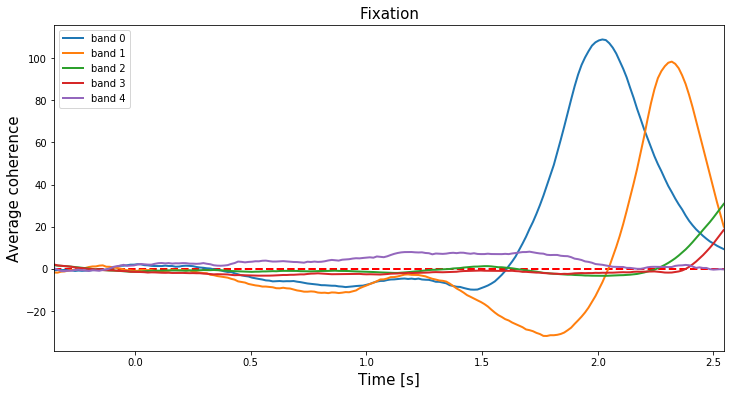

In [71]:
plt.figure(figsize=(12,6))
# Averaged supertensor
avg_coh = filtered_super_tensor_fix.mean(dim='links').mean(dim='trials')
# Baseline indexes
b_idx   = net.tarray<0
for i in range(len(net.bands)):
    Z = (avg_coh[i]-avg_coh[i,b_idx].mean())/avg_coh[i,b_idx].std()
    plt.plot(net.tarray, Z, lw=2, label='band ' + str(i) )
plt.hlines(0,net.tarray[0],net.tarray[-1], linestyles='--', color='r', lw=2)
plt.xlim([net.tarray[0],net.tarray[-1]])
plt.legend()
plt.title('Fixation', fontsize=15)
plt.xlabel('Time [s]', fontsize=15)
plt.ylabel('Average coherence', fontsize=15)

In [72]:
avg_coh = filtered_super_tensor_fix.mean(dim='links')

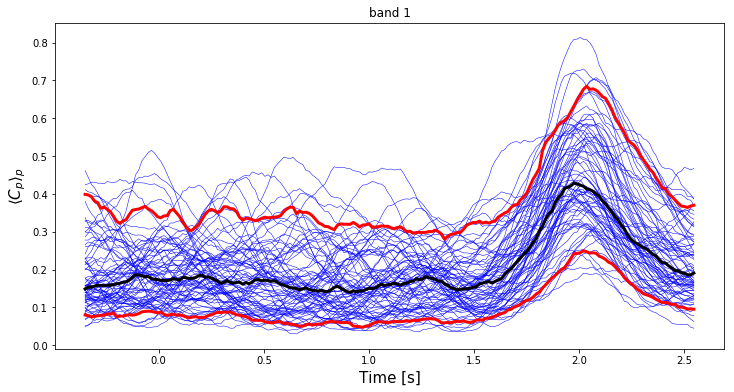

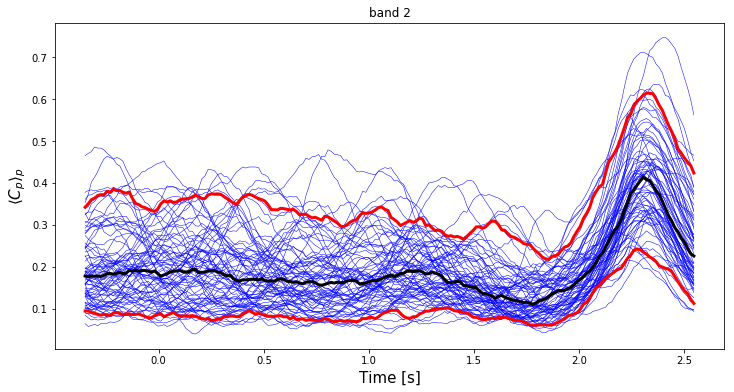

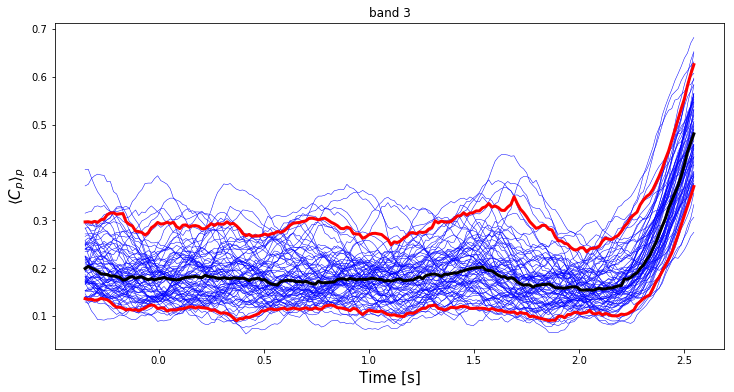

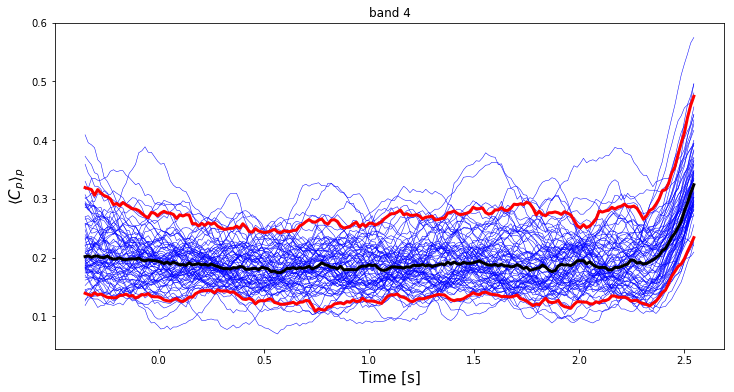

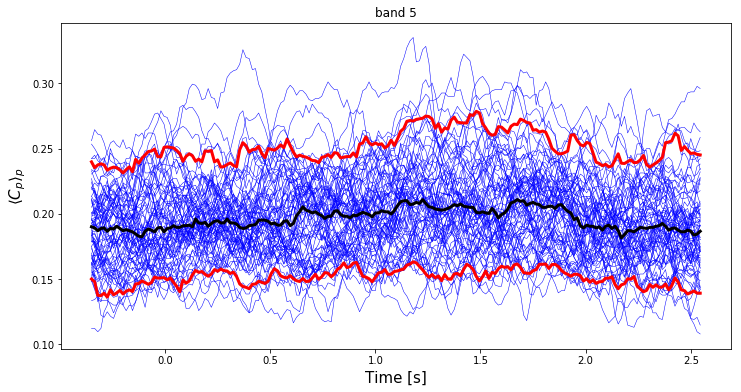

In [73]:
for b in range(len(net.bands)):
    plt.figure(figsize=(12,6))
    for i in range(avg_coh.shape[1]):
        plt.plot(net.tarray, avg_coh[b,i,:], 'b', lw=.5)
    plt.plot(net.tarray, avg_coh[b,:,:].median(dim='trials'), 'k', lw=3)
    plt.plot(net.tarray, avg_coh[b,:,:].quantile(0.95, dim='trials'), 'r', lw=3)
    plt.plot(net.tarray, avg_coh[b,:,:].quantile(0.05, dim='trials'), 'r', lw=3)
    plt.title(bands[b])
    plt.ylabel(r'$\langle C_{p}\rangle_{p}$',fontsize=15)
    plt.xlabel('Time [s]',fontsize=15)

### Strength

In [74]:
# Randomized adjacency matrix for the filtered data
A_r_fix = np.empty_like(filtered_adjacency_fix)
for t in tqdm( range(len(filtered_trials_fix)) ):
    for i in range(len(net.bands)):
        A_r_fix[:,:,i,t,:] = randomize_edges(filtered_adjacency_fix[:,:,i,t,:].values, n_rewires=1000)

100%|██████████| 76/76 [00:59<00:00,  1.27it/s]


In [75]:
##################################################################################
# NODES' DEGREE
##################################################################################
for i in tqdm( range(len(net.bands)) ): 
    Q_fix['degree'][str(i)]  = compute_nodes_degree(filtered_adjacency_fix[:,:,i,:,:].values, mirror=False)

100%|██████████| 5/5 [00:00<00:00, 21.90it/s]


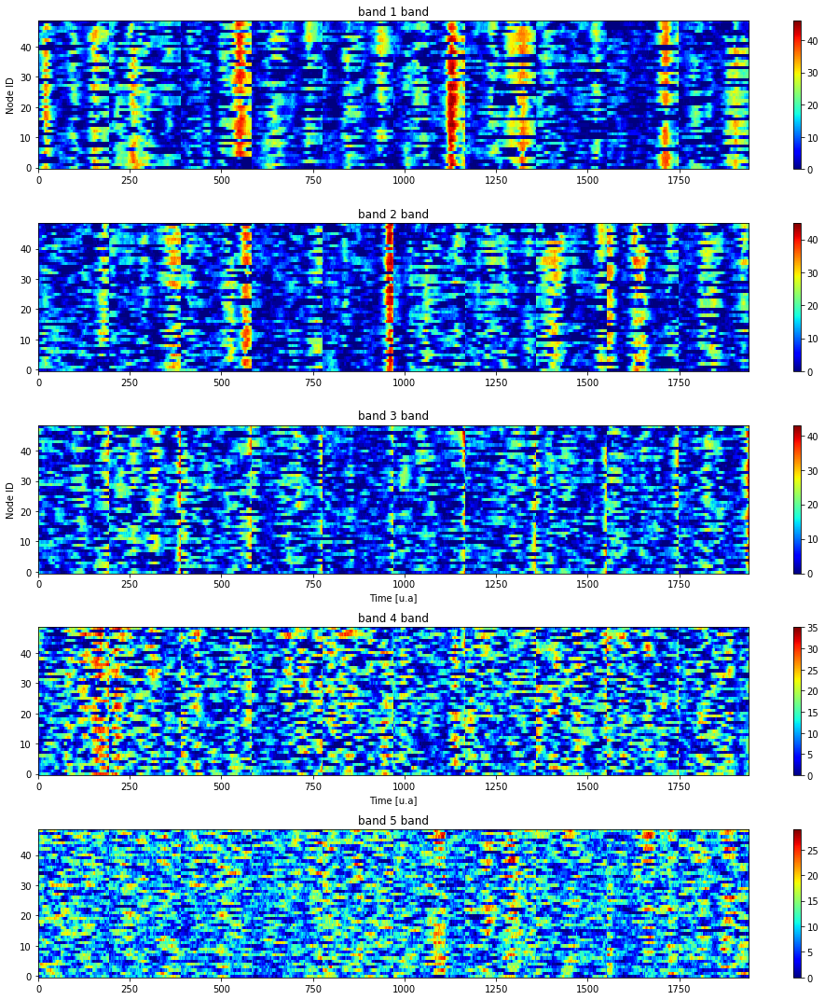

In [76]:
plt.figure(figsize=(14,15))
for i in range(len(net.bands)):
    plt.subplot(5,1,i+1)
    plt.imshow(
        Q_fix['degree'][str(i)][:,:10,:].reshape(net.super_tensor.attrs['nC'],10*len(net.tarray)), 
        aspect='auto', cmap='jet', origin='lower'
    )
    plt.colorbar()
    plt.title(bands[i]+' band')
    if i == 2 or i == 3: plt.xlabel('Time [u.a]')
    if i == 0 or i == 2: plt.ylabel('Node ID')
plt.tight_layout()

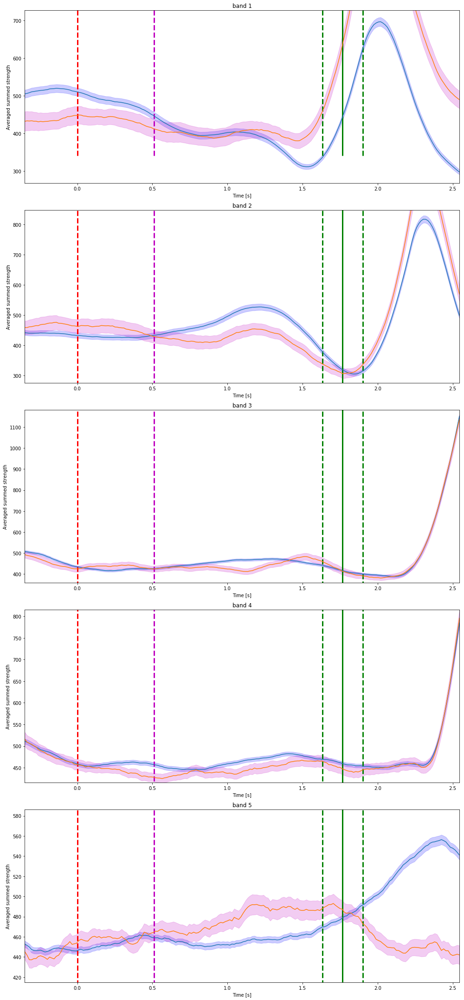

In [77]:
plt.figure(figsize=(14,30))
for j in range( len(net.bands) ):
    plt.subplot(len(net.bands),1,j+1)
    # Summed degree for all nodes
    # ODRT
    s_d = Q['degree'][str(j)].sum(axis=0)
    # Average over trials
    s_d_m = s_d.mean(axis = 0) 
    # Std over trials
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    plt.plot(net.tarray, s_d_m, label = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color='b')
    plt.ylim([s_d_m.min()-30, s_d_m.max()+30])
    # FIXATION
    s_d = Q_fix['degree'][str(j)].sum(axis=0)
    # Average over trials
    s_d_m = s_d.mean(axis = 0) 
    # Std over trials
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    plt.plot(net.tarray, s_d_m, label = 'm')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color='m')
    #
    plt.title(bands[j])
    plt.xlim([net.tarray[0],net.tarray[-1]])

    plt.vlines(0, s_d_m.min()-40, s_d_m.max()+200, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-40, s_d_m.max()+200, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-40, s_d_m.max()+200, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-40, s_d_m.max()+200, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-40, s_d_m.max()+200, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed strength')
    plt.xlabel('Time [s]')
plt.tight_layout()

### Plotting in the brain surface

In [78]:
# Creating stages mask
s_mask = create_stages_time_grid(net.super_tensor.attrs['t_cue_on'][filtered_trials_fix_idx], 
                                 net.super_tensor.attrs['t_cue_off'][filtered_trials_fix_idx],
                                 net.super_tensor.attrs['t_match_on'][filtered_trials_fix_idx], 
                                 net.super_tensor.attrs['fsample'],
                                 net.tarray, len(filtered_trials_fix_idx), flatten=True)
print(s_mask['baseline'].shape)

(14744,)


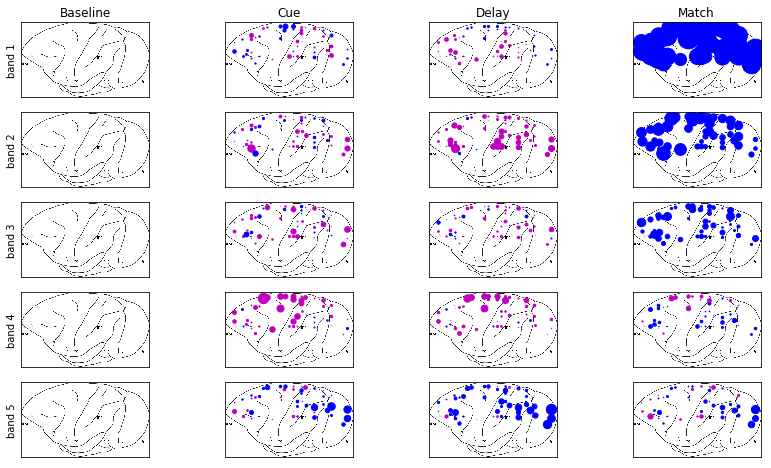

In [79]:
count = 1
alpha = 20
beta  = 1
plt.figure(figsize=(14,8))
for i in range( len(net.bands) ):
    plt.subplot(5, 4, count)
    aux    = Q_fix['degree'][str(i)].reshape(net.super_tensor.attrs['nC'],len(filtered_trials_fix) * len(net.tarray))
    # Baseline
    st_b   = aux[:,s_mask['baseline']].mean(axis=-1)
    sst_b  = aux[:,s_mask['baseline']].std(axis=-1)
    #st_bn = st_random[:,i,net.t_baseline].mean(axis=1)
    #st_b  = (st_b - st_b)/st_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_b-st_b, alpha, beta, 'hot')
    count += 1
    plt.ylabel(bands[i])
    if i == 0: plt.title('Baseline')
    # Cue
    plt.subplot(5, 4, count)
    st_c = aux[:,s_mask['cue']].mean(axis=-1)
    #st_cn = st_random[:,i,net.t_cue].mean(axis=1)
    st_c = (st_c - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_c, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Cue')
    # Delay
    plt.subplot(5, 4, count)
    st_d = aux[:,s_mask['delay']].mean(axis=-1).mean(axis=-1)
    #st_dn = st_random[:,i,net.t_delay].mean(axis=1)
    st_d = (st_d - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_d, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Delay')
    # Match
    plt.subplot(5, 4, count)
    st_m = aux[:,s_mask['match']].mean(axis=-1).mean(axis=-1)
    #st_mn = st_random[:,i,net.t_match].mean(axis=1)
    st_m = (st_m - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_m, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Match')

In [19]:
net.A = net.A.stack(z=("trials","time"))

In [18]:
net.A

<xarray.DataArray (roi_1: 49, roi_2: 49, bands: 5, trials: 540, time: 184)>
array([[[[[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
...
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]]]]])
Coordinates:
  * trials   (trials) int64 1 2 3 9 12 13 14 15 ... 875 877 879 880 883 884 886
  * time     (time) float64 -0.2 -0.185 -0.17 -0.155 ... 2.5 2.515 2.53 2.545
  * roi_1    (roi_1) uint8 1 4 9 13 16 17 22 23 ... 210 219 221 224 242 248 250
  * roi_2    (roi_2) uint8 1 4 9 13 16 17 22 23 ... 210 219 221 224 242 248 250
Dimensions without coordinates: bands

In [21]:
net.A.unstack()

<xarray.DataArray (roi_1: 49, roi_2: 49, bands: 5, trials: 540, time: 184)>
array([[[[[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
...
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]]]]])
Coordinates:
  * roi_1    (roi_1) uint8 1 4 9 13 16 17 22 23 ... 210 219 221 224 242 248 250
  * roi_2    (roi_2) uint8 1 4 9 13 16 17 22 23 ... 210 219 221 224 242 248 250
  * trials   (trials) int64 1 2 3 9 12 13 14 15 ... 875 877 879 880 883 884 886
  * time     (time) float64 -0.2 -0.185 -0.17 -0.155 ... 2.5 2.515 2.53 2.545
Dimensions without coordinates: bands

In [73]:
type(net.A.time)

xarray.core.dataarray.DataArray